# Análisis de la importancia y las interacciones entre hiperparámetros de NSGA-II en la suite ZCAT

## Objetivo del capítulo

Una vez identificado el rendimiento relativo de los distintos *samplers* mediante el análisis estadístico previo, el siguiente paso consiste en estudiar las **configuraciones de hiperparámetros** que dieron lugar a dichos resultados. Para ello se analiza:

- la **importancia relativa** de cada hiperparámetro,
- las **interacciones** existentes entre ellos,
- y los **patrones comunes** presentes en las mejores configuraciones encontradas durante la optimización.

### Preguntas de investigación

1. ¿Qué hiperparámetros tienen mayor influencia sobre el hipervolumen (HV) alcanzado?
2. ¿Es esa importancia consistente entre problemas o depende del problema considerado?
3. ¿Coinciden los dos mejores *samplers* de un mismo problema en los hiperparámetros que consideran relevantes?
4. ¿Qué valores concretos aparecen con mayor frecuencia entre los mejores *trials*?
5. ¿Existen interacciones importantes entre hiperparámetros que expliquen mejoras de rendimiento?
6. ¿Es posible proponer una configuración general de NSGA-II para la suite ZCAT basada en la evidencia obtenida?

### Estrategia de selección de estudios

Analizar los 140 estudios completos (7 *samplers* × 20 problemas) sería inabarcable, y analizar únicamente el mejor *sampler* global introduciría sesgo (se estudiaría cómo configura ese *sampler* concreto a NSGA-II, no cómo debería configurarse NSGA-II en general).

Por ello, **para cada uno de los 20 problemas ZCAT se seleccionan los dos mejores *samplers*** (según el HV normalizado obtenido) y se analizan ambos. Si dos optimizadores completamente distintos convergen hacia configuraciones similares, eso constituye una evidencia sólida de que esos hiperparámetros son intrínsecamente buenos para NSGA-II en ese problema — una conclusión con mucho más valor científico que la que se obtendría analizando un único *sampler*.

### Fuentes de datos

| Fuente | Contenido | Uso |
|---|---|---|
| `tfm_final.db` (SQLite) | Los 140 estudios completos de Optuna: *trials*, valores objetivo (HV), hiperparámetros, estados, tiempos, atributos de usuario y de sistema | Fuente **primaria**. Se carga con `optuna.load_study(...)` porque el análisis (fANOVA, *contour*, *slice*, coordenadas paralelas...) necesita el objeto `Study` completo, no solo un resumen tabular |
| `study_summary_normalized.csv` (o `study_summary.csv`) | Una fila por estudio: `problem`, `sampler`, `hv`, `hv_norm`, `rank`, `wins`... | Permite identificar rápidamente el mejor *sampler* de cada problema y **seleccionar** qué estudios cargar después desde SQLite |

Flujo de trabajo:

```
CSV  →  selecciona los 2 mejores estudios por problema  →  SQLite  →  análisis detallado
```

### Estructura del notebook

- **Bloque 1** — Selección automática de los dos mejores *samplers* por problema (40 estudios en total).
- **Bloque 2** — Análisis individual de cada estudio (fANOVA, *param importance*, *slice*, *parallel coordinates*, *contour*, *optimization history*).
- **Bloque 3** — Construcción de un DataFrame global de *trials* (`study.trials_dataframe()` de los 40 estudios apilados).
- **Bloque 4** — Análisis transversal (importancia media, *heatmap* problema × parámetro, estabilidad, frecuencia de operadores, distribuciones, análisis del top 10%, correlaciones, interacciones, configuración maestra final).


## 0. Configuración inicial y librerías

In [ ]:

import os
import sqlite3
import warnings
import itertools
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

import optuna
from optuna.importance import get_param_importances, FanovaImportanceEvaluator

warnings.filterwarnings("ignore", category=FutureWarning)
optuna.logging.set_verbosity(optuna.logging.WARNING)

sns.set_theme(style="whitegrid", context="notebook")
plt.rcParams["figure.figsize"] = (10, 6)

DB_PATH  = Path("tfm_final.db")                       # base de datos SQLite con los 140 estudios
STORAGE  = f"sqlite:///{DB_PATH}"

CSV_PATH = Path("../data/processed/study_summary_normalized.csv")       # resumen con una fila por estudio
COL_PROBLEM  = "problem"
COL_SAMPLER  = "sampler"
COL_HV       = "hv_norm"        # métrica usada para el ranking (usar 'hv' si no existe hv_norm)
COL_STUDY_NAME = "study_name"  

OUTPUT_DIR = Path("outputs_hyperparam_analysis")
OUTPUT_DIR.mkdir(exist_ok=True)

N_TOP_SAMPLERS_PER_PROBLEM = 2
TOP_PERCENTILE = 0.90   # percentil 90 -> top 10% de trials

assert DB_PATH.exists(), f"No se encuentra la base de datos: {DB_PATH.resolve()}"
assert CSV_PATH.exists(), f"No se encuentra el CSV resumen: {CSV_PATH.resolve()}"

print("Configuración cargada correctamente.")


Configuración cargada correctamente.


## Bloque 1 — Selección automática de los dos mejores *samplers* por problema

Para cada uno de los 20 problemas ZCAT, se ordenan los *samplers* según el HV (normalizado) obtenido y se seleccionan los dos mejores. El resultado son **40 estudios** a analizar en los bloques siguientes.


In [7]:

summary_df = pd.read_csv(CSV_PATH)
summary_df[COL_STUDY_NAME] = summary_df[COL_SAMPLER] + '_' + summary_df[COL_PROBLEM] + '_s3'
summary_df.head()


,sampler,problem,n_trials,hv,mean_value,std_value,total_duration,mean_trial_duration,hv_norm,rank,study_name
0,cmaes,zcat1,50,0.254027,0.153123,0.089824,4518.993983,90.379879,0.505914,4.0,cmaes_zcat1_s3
1,cmaes,zcat10,50,0.112726,0.068460,0.040746,5614.772873,112.295457,0.870393,3.0,cmaes_zcat10_s3
2,cmaes,zcat11,50,0.210841,0.117430,0.077371,4183.296339,83.665926,0.000000,7.0,cmaes_zcat11_s3
3,cmaes,zcat12,50,0.195056,0.127362,0.072957,3571.041948,71.420838,0.439294,5.0,cmaes_zcat12_s3
4,cmaes,zcat13,50,0.249413,0.154064,0.093711,5403.319708,108.066394,0.830539,4.0,cmaes_zcat13_s3


In [ ]:
def build_top2_summary(
    df,
    problem_col=COL_PROBLEM,
    sampler_col=COL_SAMPLER,
    hv_col=COL_HV
):
    """
    Selecciona los dos mejores estudios por problema según HV_norm
    y devuelve una fila por problema con:
        - Top-1 sampler
        - Top-1 HV_norm
        - Top-2 sampler
        - Top-2 HV_norm
        - Diferencia entre ambos HV_norm
    """

    # Ordenar por problema y HV de mayor a menor
    ranked = (
        df.sort_values(
            [problem_col, hv_col],
            ascending=[True, False]
        )
        .groupby(problem_col)
        .head(2)
        .copy()
    )

    # Crear ranking local dentro de cada problema
    ranked["local_rank"] = (
        ranked.groupby(problem_col)[hv_col]
        .rank(
            ascending=False,
            method="first"
        )
        .astype(int)
    )

    # Pasar de formato largo a una fila por problema
    top1 = (
        ranked[ranked["local_rank"] == 1]
        [[problem_col, sampler_col, hv_col]]
        .rename(columns={
            sampler_col: "sampler_top1",
            hv_col: "hv_norm_top1"
        })
    )

    top2 = (
        ranked[ranked["local_rank"] == 2]
        [[problem_col, sampler_col, hv_col]]
        .rename(columns={
            sampler_col: "sampler_top2",
            hv_col: "hv_norm_top2"
        })
    )

    # Unir Top-1 y Top-2
    summary = (
        top1.merge(
            top2,
            on=problem_col,
            how="left"
        )
    )

    # Diferencia absoluta de HV_norm
    summary["delta_hv_norm"] = (
        summary["hv_norm_top1"]
        - summary["hv_norm_top2"]
    )

    # Ordenar por número de ZCAT
    summary["_problem_num"] = (
        summary[problem_col]
        .str.extract(r"(\d+)")
        .astype(int)
    )

    summary = (
        summary
        .sort_values("_problem_num")
        .drop(columns="_problem_num")
        .reset_index(drop=True)
    )

    return summary


# Generar tabla resumen
top2_summary = build_top2_summary(summary_df)

# Mostrar resultados
print(top2_summary.to_string(index=False))

# Comprobación
print(
    f"\nProblemas incluidos: {len(top2_summary)}"
)

print(
    f"Columnas: {list(top2_summary.columns)}"
)

problem sampler_top1  hv_norm_top1 sampler_top2  hv_norm_top2  delta_hv_norm
  zcat1       nsgaii           1.0          tpe      0.677901       0.322099
  zcat2          tpe           1.0        cmaes      0.869708       0.130292
  zcat3          tpe           1.0          qmc      0.389260       0.610740
  zcat4      nsgaiii           1.0          tpe      0.627355       0.372645
  zcat5      nsgaiii           1.0          tpe      0.973104       0.026896
  zcat6          tpe           1.0        cmaes      0.680049       0.319951
  zcat7           gp           1.0          tpe      0.887857       0.112143
  zcat8           gp           1.0          tpe      0.868709       0.131291
  zcat9       nsgaii           1.0        cmaes      0.924091       0.075909
 zcat10          tpe           1.0       nsgaii      0.895444       0.104556
 zcat11          qmc           1.0          tpe      0.737189       0.262811
 zcat12          tpe           1.0           gp      0.971835       0.028165

In [9]:

def select_top_samplers(df, problem_col=COL_PROBLEM, sampler_col=COL_SAMPLER,
                         hv_col=COL_HV, n_top=N_TOP_SAMPLERS_PER_PROBLEM):
    """Para cada problema, devuelve las n_top filas con mayor HV."""
    ranked = (
        df.sort_values([problem_col, hv_col], ascending=[True, False])
          .groupby(problem_col, group_keys=False)
          .head(n_top)
          .copy()
    )
    ranked["local_rank"] = (
        ranked.groupby(problem_col)[hv_col]
              .rank(ascending=False, method="first")
              .astype(int)
    )
    return ranked.reset_index(drop=True)


selected_studies = select_top_samplers(summary_df)

print(f"Estudios seleccionados: {len(selected_studies)} "
      f"(esperado: {summary_df[COL_PROBLEM].nunique()} problemas x {N_TOP_SAMPLERS_PER_PROBLEM})")
selected_studies


Estudios seleccionados: 40 (esperado: 20 problemas x 2)


,sampler,problem,n_trials,hv,mean_value,std_value,total_duration,mean_trial_duration,hv_norm,rank,study_name,local_rank
0,nsgaii,zcat1,50,0.256574,0.152928,0.089338,6540.237180,130.804743,1.000000,1.0,nsgaii_zcat1_s3,1
1,tpe,zcat1,50,0.254913,0.188052,0.085663,6988.353146,139.767062,0.677901,2.0,tpe_zcat1_s3,2
2,tpe,zcat10,50,0.113323,0.079440,0.041278,3701.644843,74.032896,1.000000,1.0,tpe_zcat10_s3,1
3,nsgaii,zcat10,50,0.112842,0.065744,0.042669,5263.689749,105.273794,0.895444,2.0,nsgaii_zcat10_s3,2
4,qmc,zcat11,50,0.216718,0.118151,0.079974,5423.678673,108.473573,1.000000,1.0,qmc_zcat11_s3,1
5,tpe,zcat11,50,0.215173,0.159509,0.070554,3899.469110,77.989382,0.737189,2.0,tpe_zcat11_s3,2
6,tpe,zcat12,50,0.201214,0.155364,0.056748,3899.442396,77.988847,1.000000,1.0,tpe_zcat12_s3,1
7,gp,zcat12,50,0.200905,0.136940,0.073762,4692.270485,93.845409,0.971835,2.0,gp_zcat12_s3,2
8,qmc,zcat13,50,0.252531,0.123263,0.092668,4515.945457,90.318909,1.000000,1.0,qmc_zcat13_s3,1
9,nsgaii,zcat13,50,0.249635,0.136999,0.096273,5644.940570,112.898811,0.842601,2.0,nsgaii_zcat13_s3,2


In [10]:

def resolve_study_name(row, storage=STORAGE):
    """
    Determina el nombre exacto del estudio en la base SQLite para una fila
    (problem, sampler) del CSV.

    1. Si el CSV ya trae la columna COL_STUDY_NAME, se usa directamente.
    2. En caso contrario, se buscan coincidencias entre los nombres reales de
       estudio almacenados en la base de datos y el patrón "sampler" + "problem".
    """
    if COL_STUDY_NAME in row and pd.notna(row[COL_STUDY_NAME]):
        return row[COL_STUDY_NAME]

    all_summaries = optuna.get_all_study_summaries(storage=storage)
    candidates = [
        s.study_name for s in all_summaries
        if str(row[COL_SAMPLER]).lower() in s.study_name.lower()
        and str(row[COL_PROBLEM]).lower() in s.study_name.lower()
    ]
    if len(candidates) == 1:
        return candidates[0]
    elif len(candidates) > 1:
        raise ValueError(
            f"Ambigüedad al resolver el estudio para {row[COL_SAMPLER]} / "
            f"{row[COL_PROBLEM]}: {candidates}"
        )
    else:
        raise ValueError(
            f"No se ha encontrado ningún estudio en la base de datos para "
            f"sampler='{row[COL_SAMPLER]}' problem='{row[COL_PROBLEM]}'. "
            f"Revisa el patrón de nombres o rellena la columna '{COL_STUDY_NAME}' en el CSV."
        )


selected_studies["study_name"] = selected_studies.apply(resolve_study_name, axis=1)
selected_studies[[COL_PROBLEM, COL_SAMPLER, COL_HV, "local_rank", "study_name"]]


,problem,sampler,hv_norm,local_rank,study_name
0,zcat1,nsgaii,1.000000,1,nsgaii_zcat1_s3
1,zcat1,tpe,0.677901,2,tpe_zcat1_s3
2,zcat10,tpe,1.000000,1,tpe_zcat10_s3
3,zcat10,nsgaii,0.895444,2,nsgaii_zcat10_s3
4,zcat11,qmc,1.000000,1,qmc_zcat11_s3
5,zcat11,tpe,0.737189,2,tpe_zcat11_s3
6,zcat12,tpe,1.000000,1,tpe_zcat12_s3
7,zcat12,gp,0.971835,2,gp_zcat12_s3
8,zcat13,qmc,1.000000,1,qmc_zcat13_s3
9,zcat13,nsgaii,0.842601,2,nsgaii_zcat13_s3


## Bloque 2 — Análisis individual por estudio

Cada uno de los 40 estudios seleccionados pasa por el mismo proceso de análisis:

1. Información básica (problema, *sampler*, HV final, número de *trials*, duración).
2. Importancia de hiperparámetros mediante **fANOVA** (`optuna.importance.get_param_importances`).
3. `plot_param_importances`
4. `plot_slice`
5. `plot_parallel_coordinate`
6. `plot_contour` (solo entre los dos hiperparámetros más importantes)
7. `plot_optimization_history`

Los resultados de importancia de cada estudio se almacenan para el análisis transversal del Bloque 4.


Analizando: zcat1 | nsgaii  (nsgaii_zcat1_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


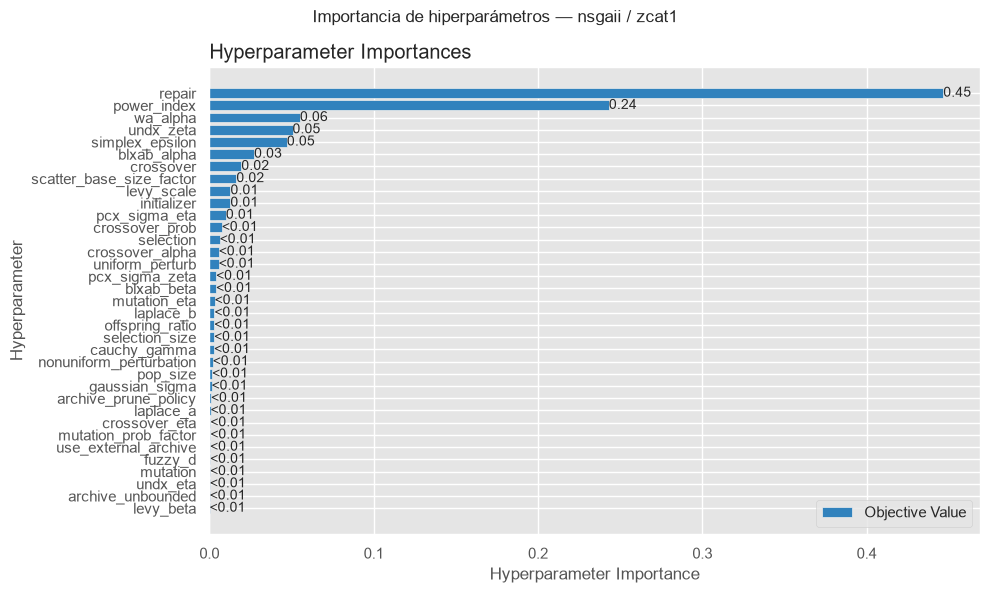

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


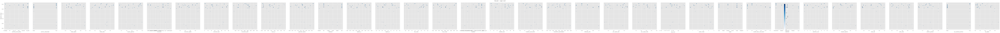

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


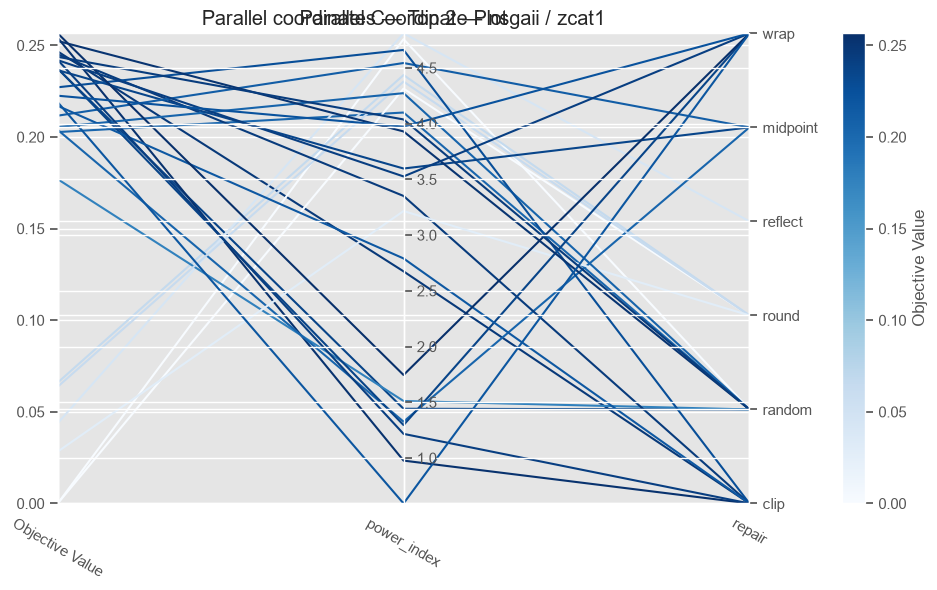

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


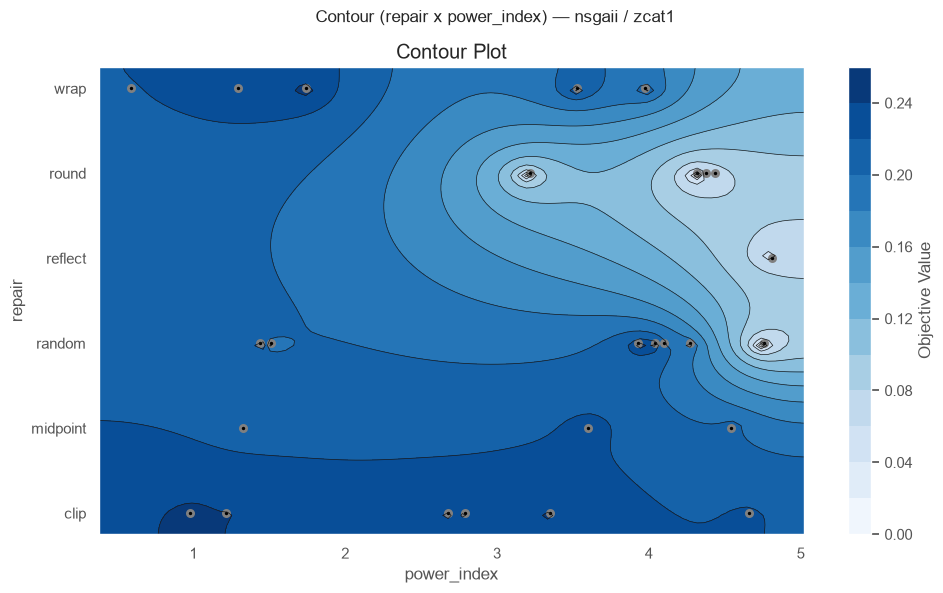

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


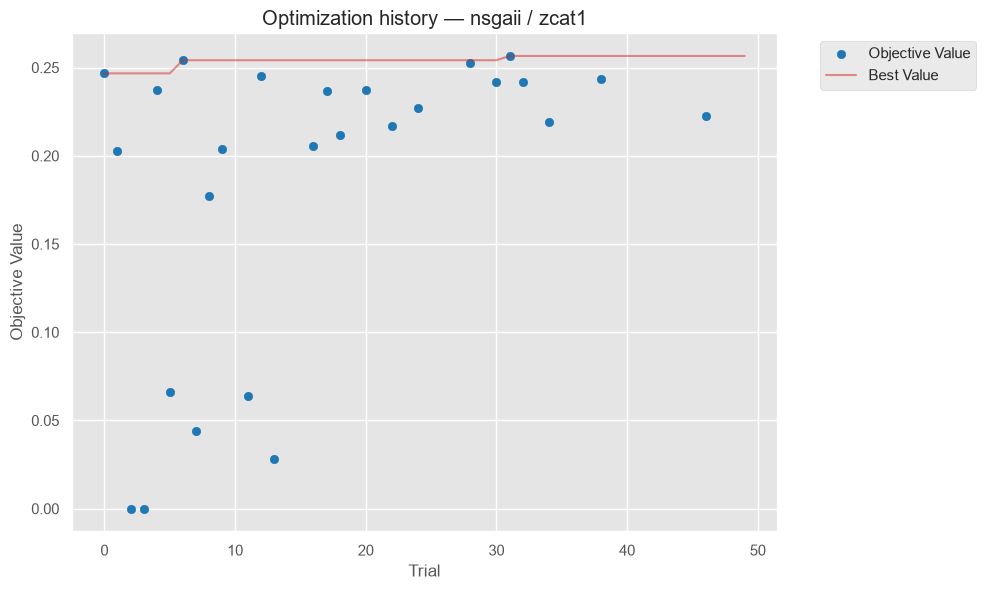

Analizando: zcat1 | tpe  (tpe_zcat1_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


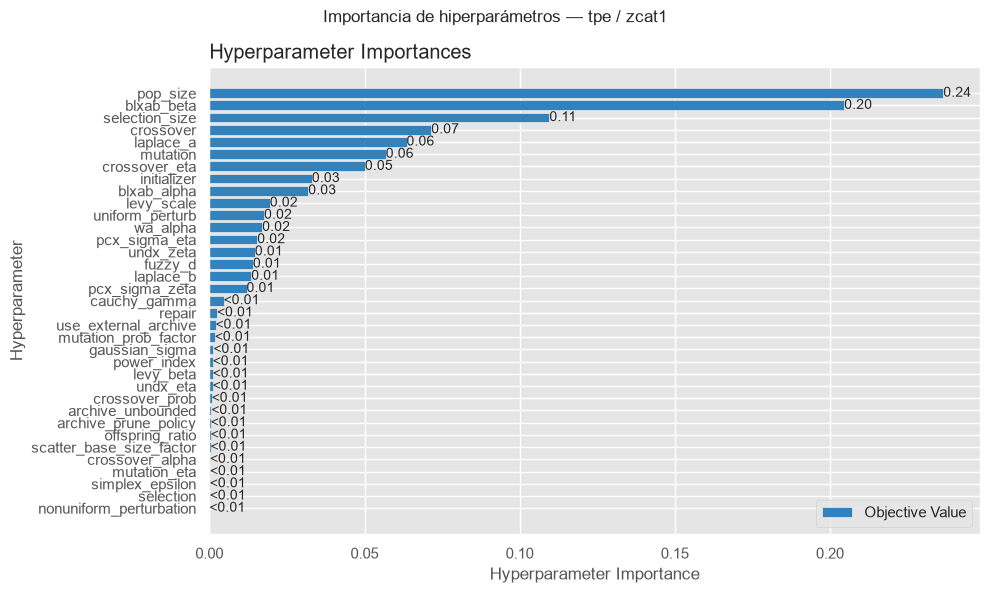

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


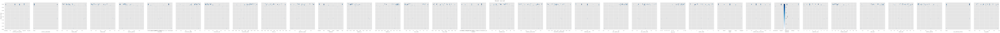

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


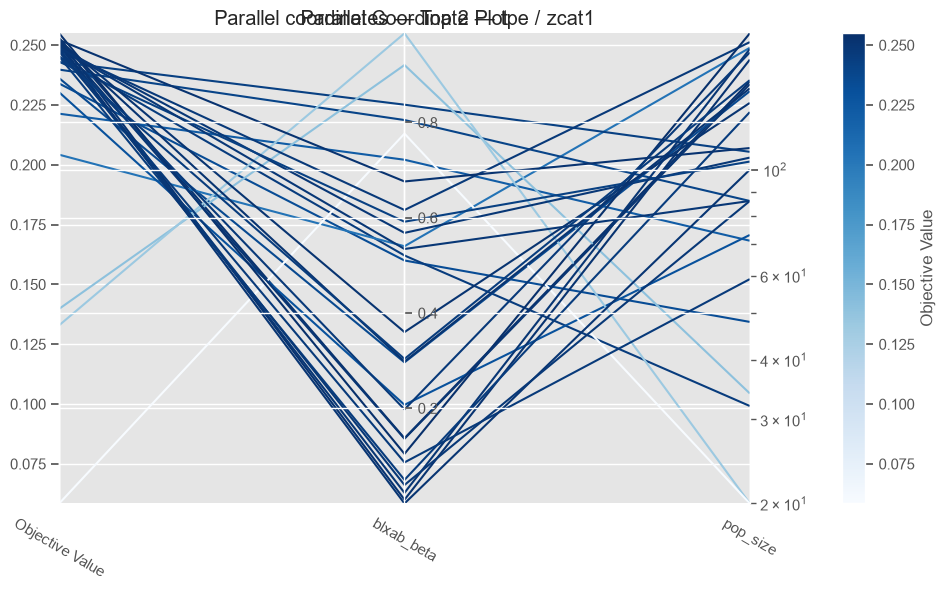

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


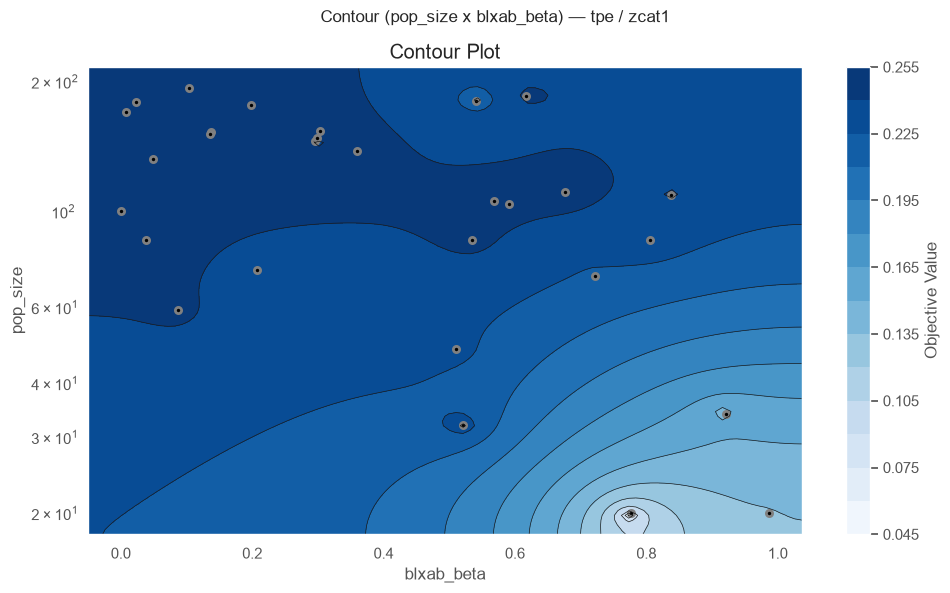

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


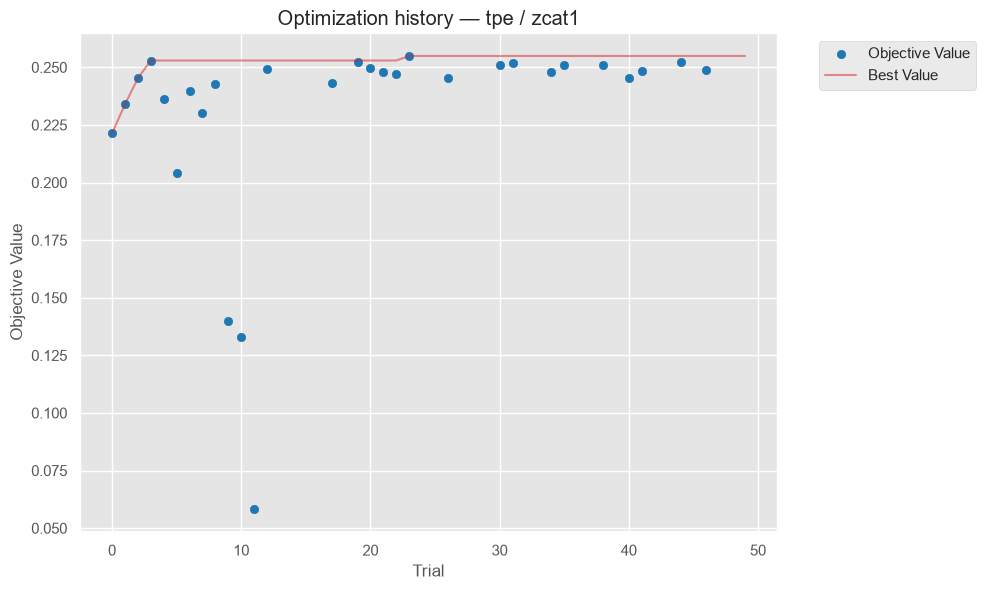

Analizando: zcat10 | tpe  (tpe_zcat10_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


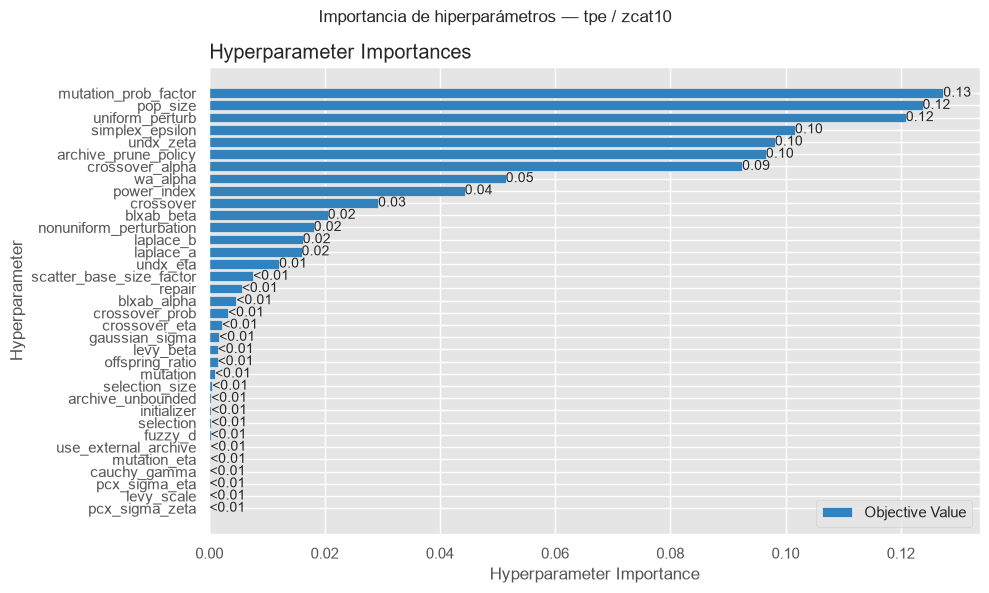

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


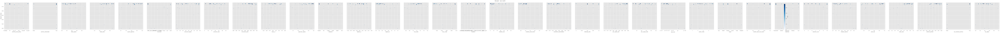

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


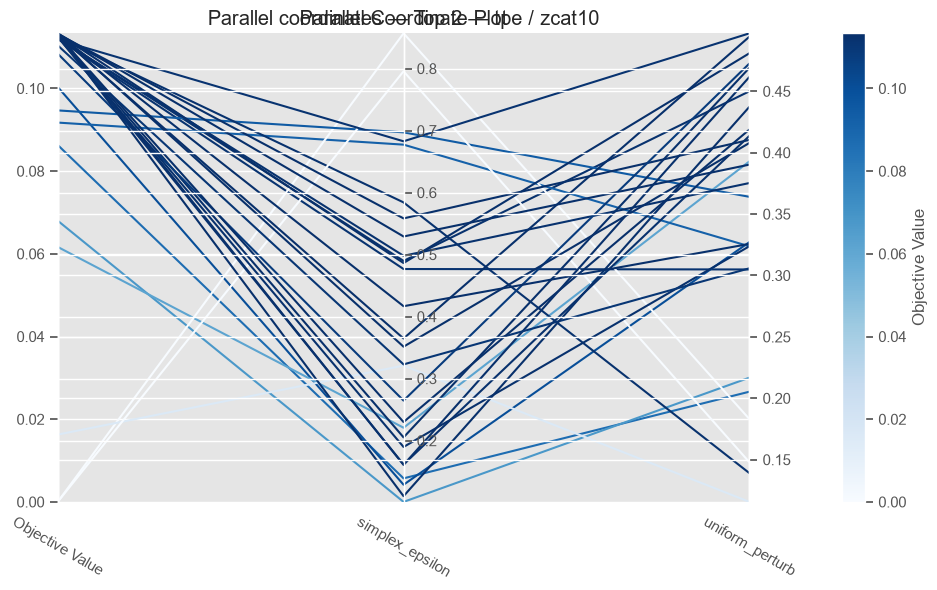

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


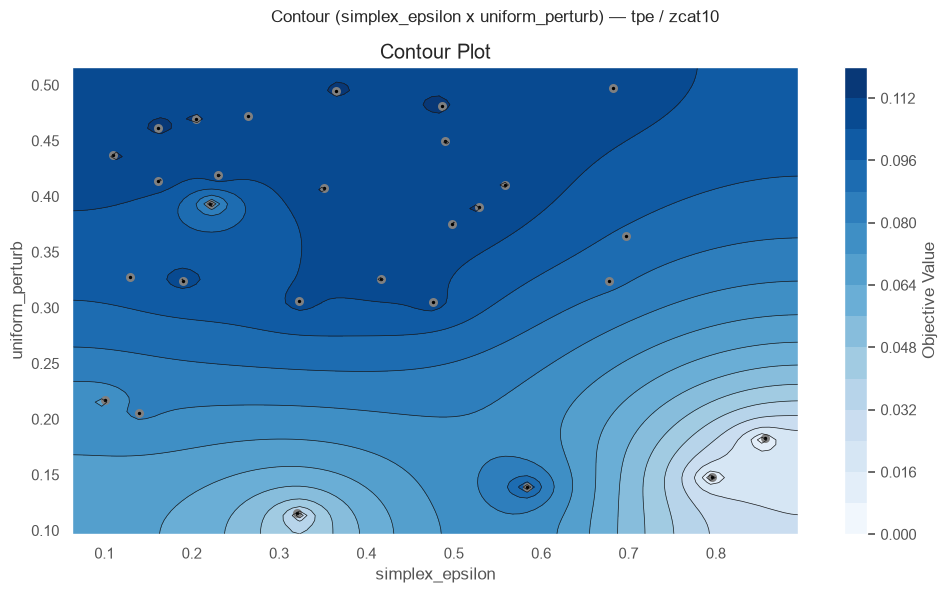

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


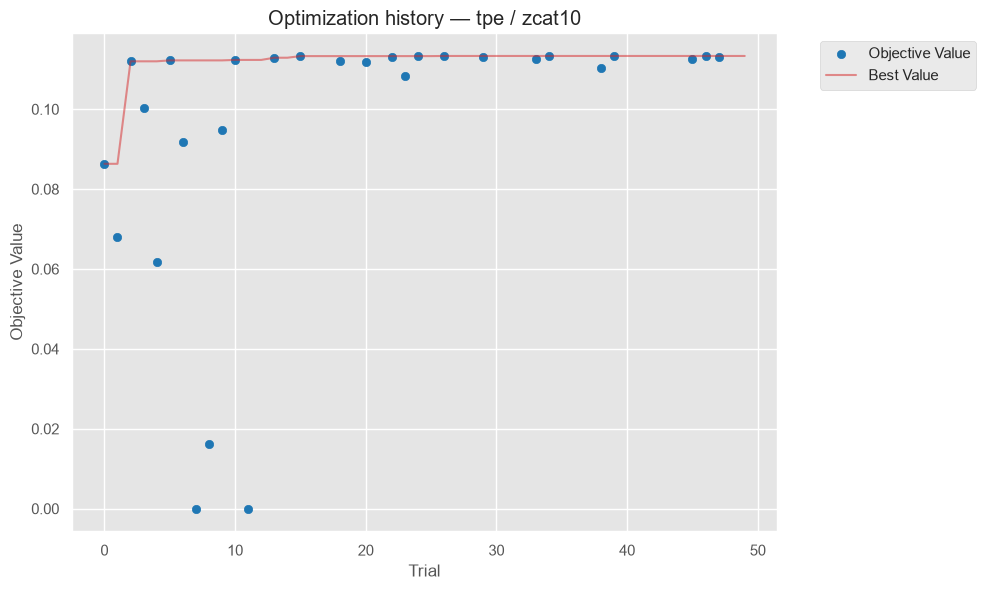

Analizando: zcat10 | nsgaii  (nsgaii_zcat10_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


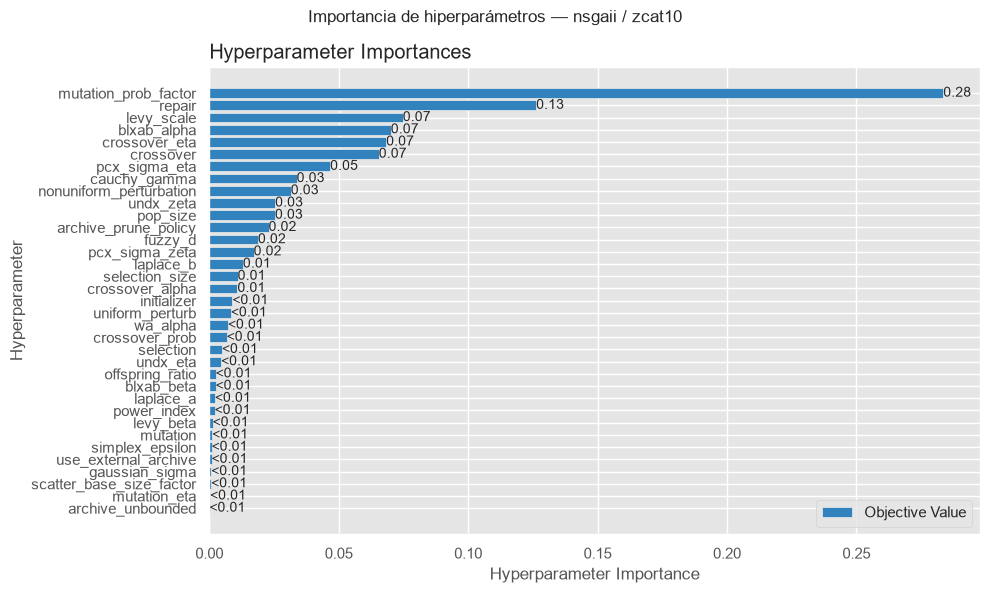

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


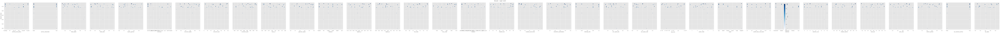

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


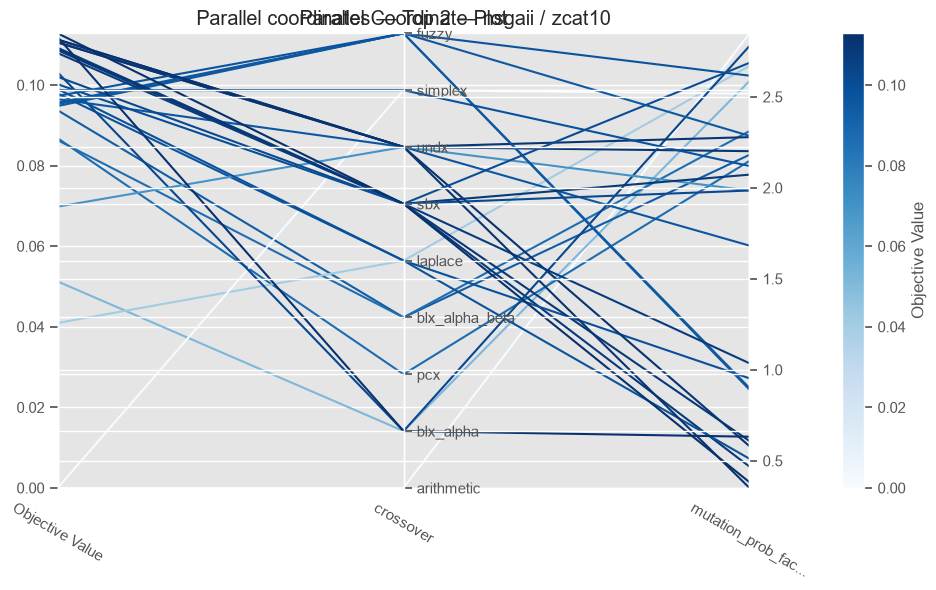

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


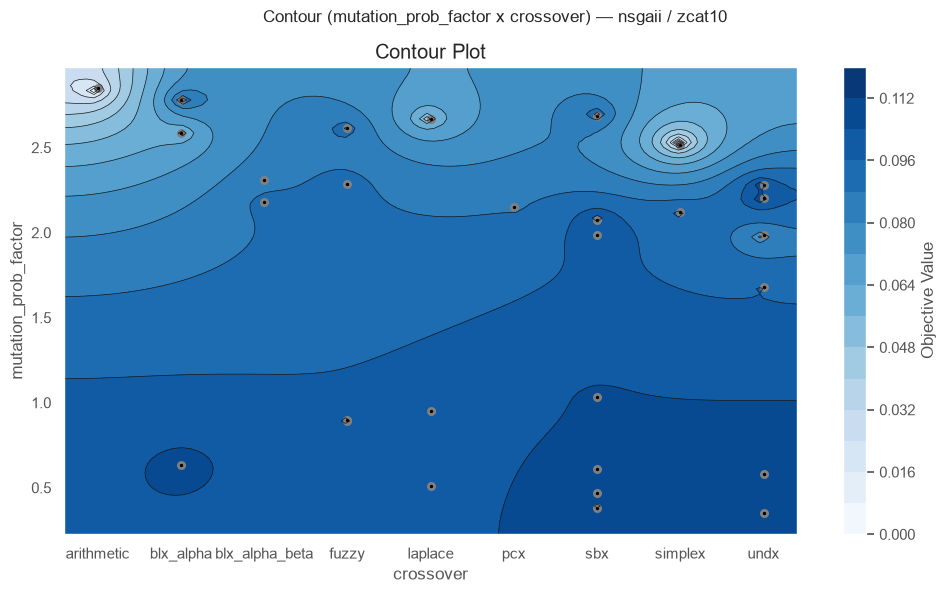

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


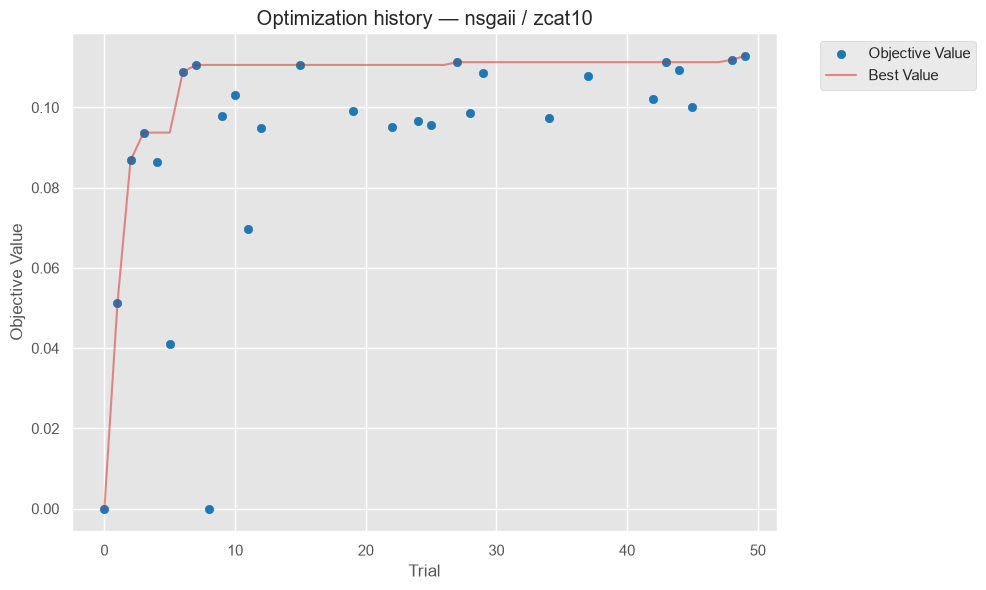

Analizando: zcat11 | qmc  (qmc_zcat11_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


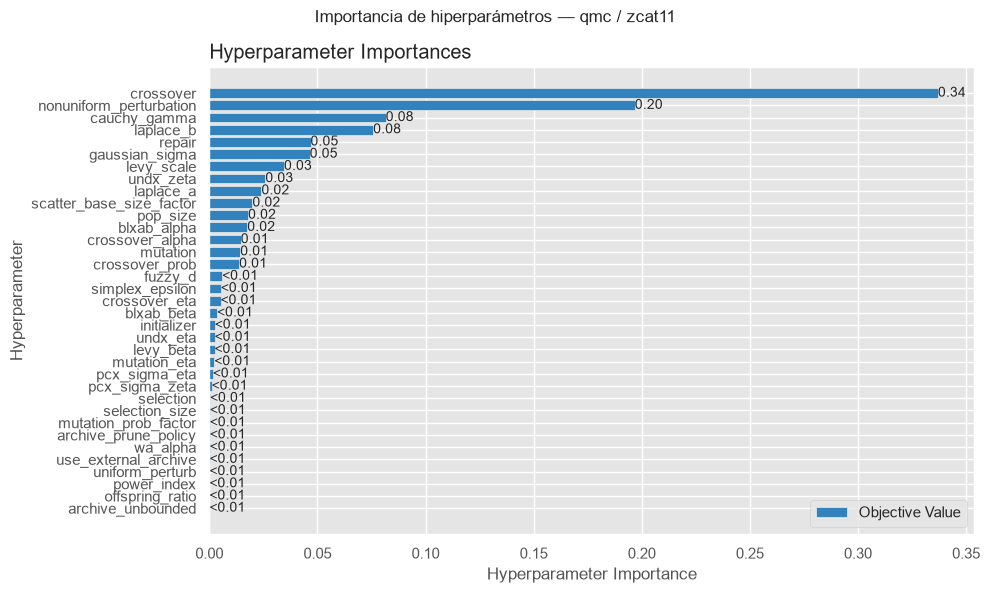

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


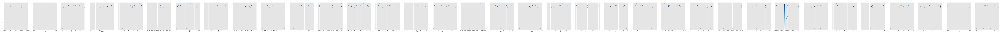

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


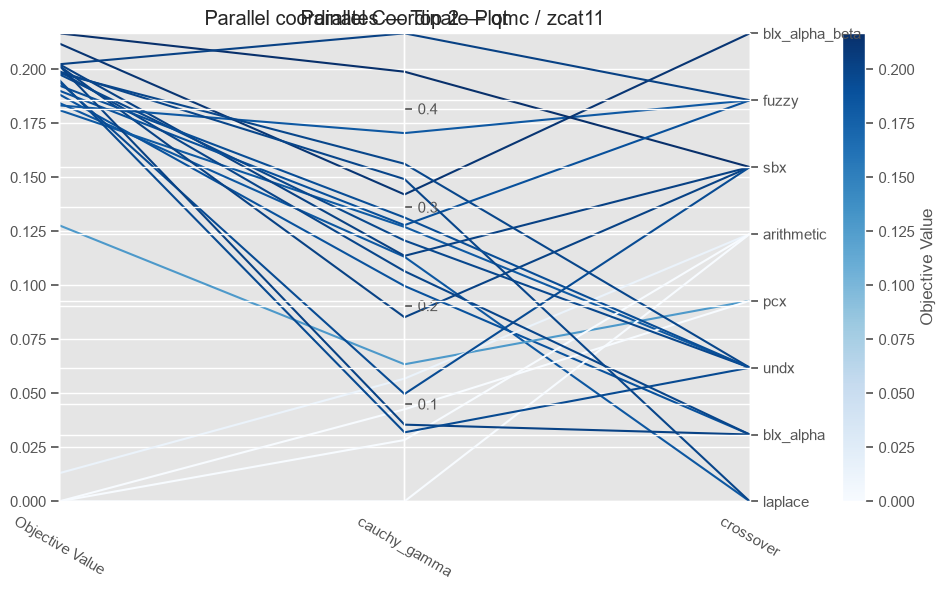

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


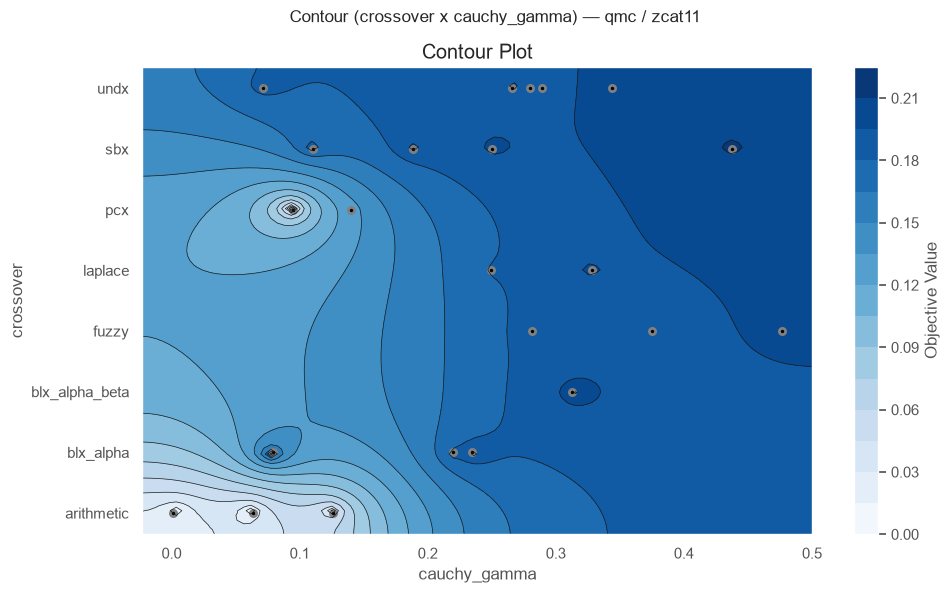

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


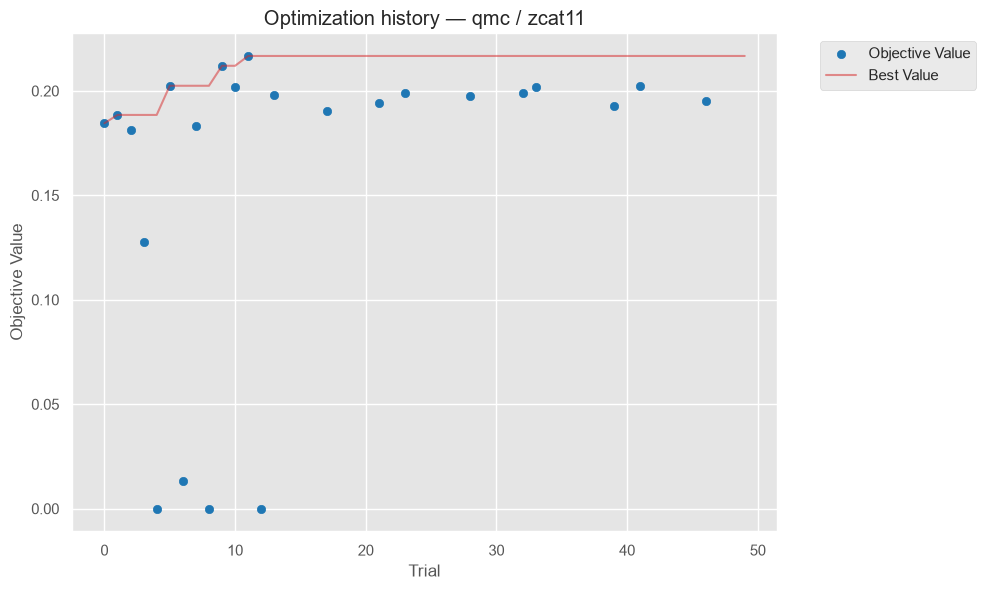

Analizando: zcat11 | tpe  (tpe_zcat11_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


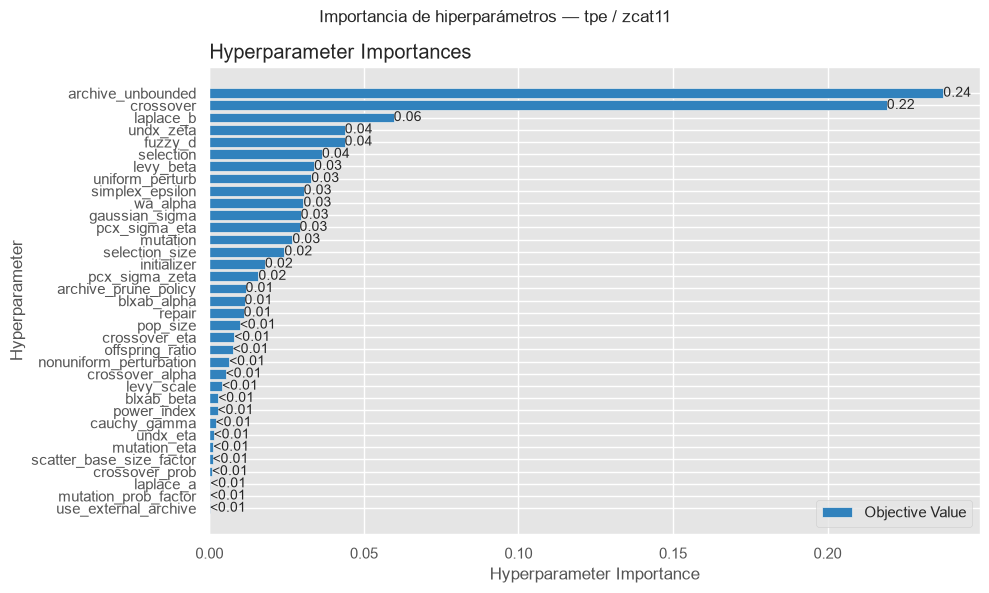

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


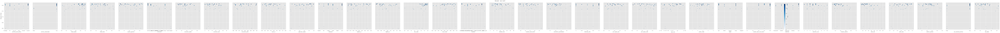

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


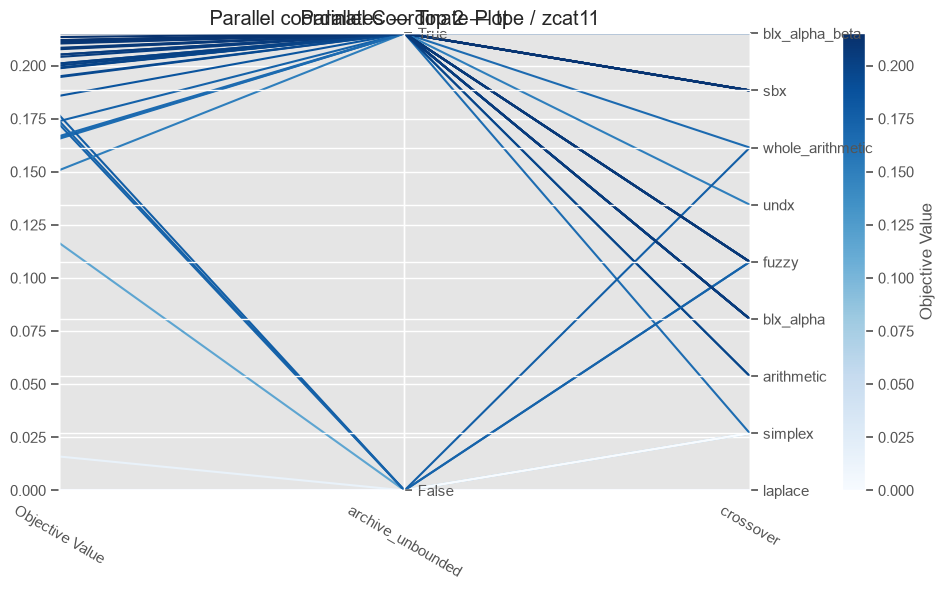

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


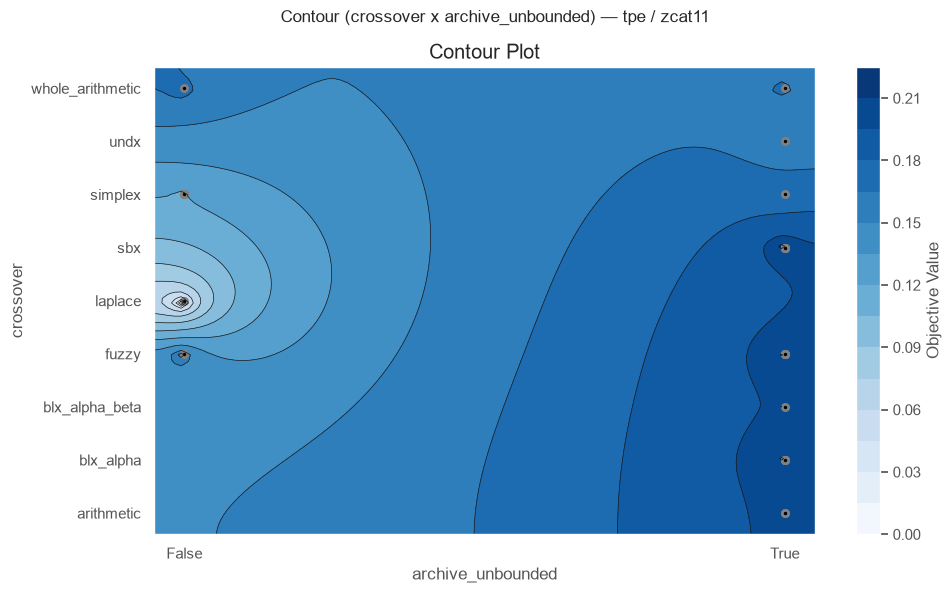

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


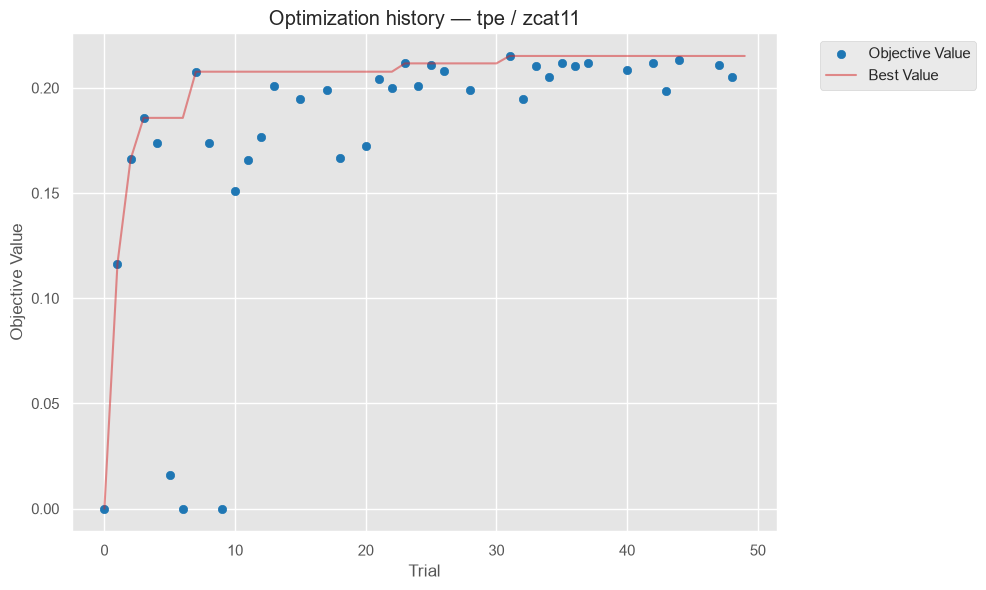

Analizando: zcat12 | tpe  (tpe_zcat12_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


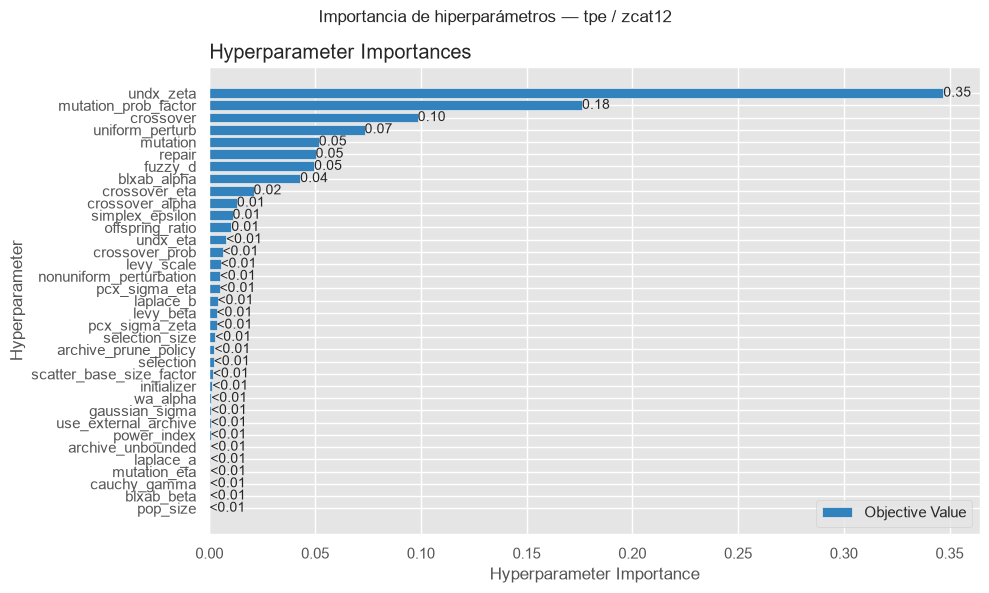

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


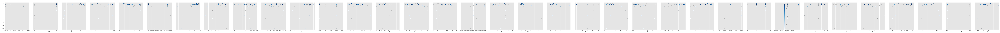

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


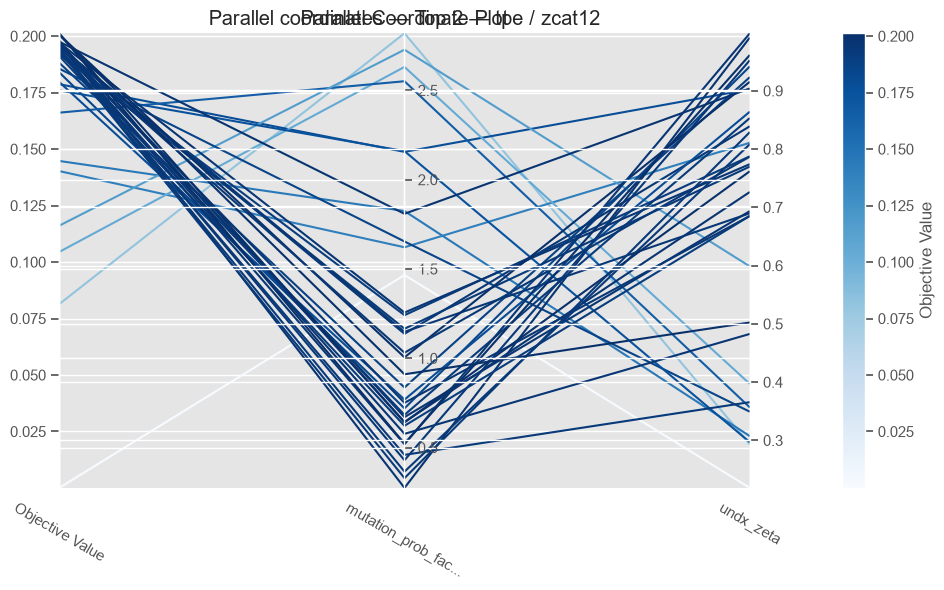

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


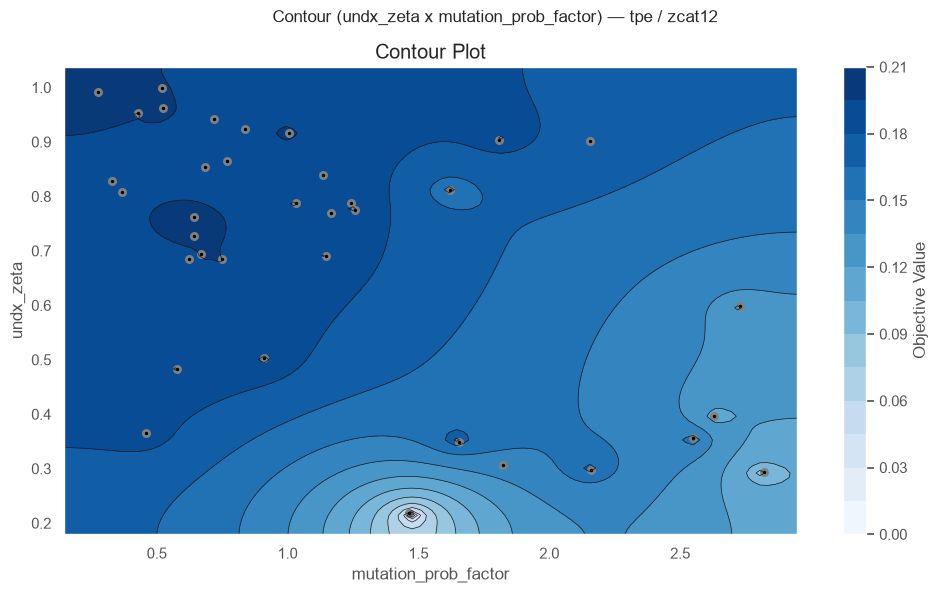

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


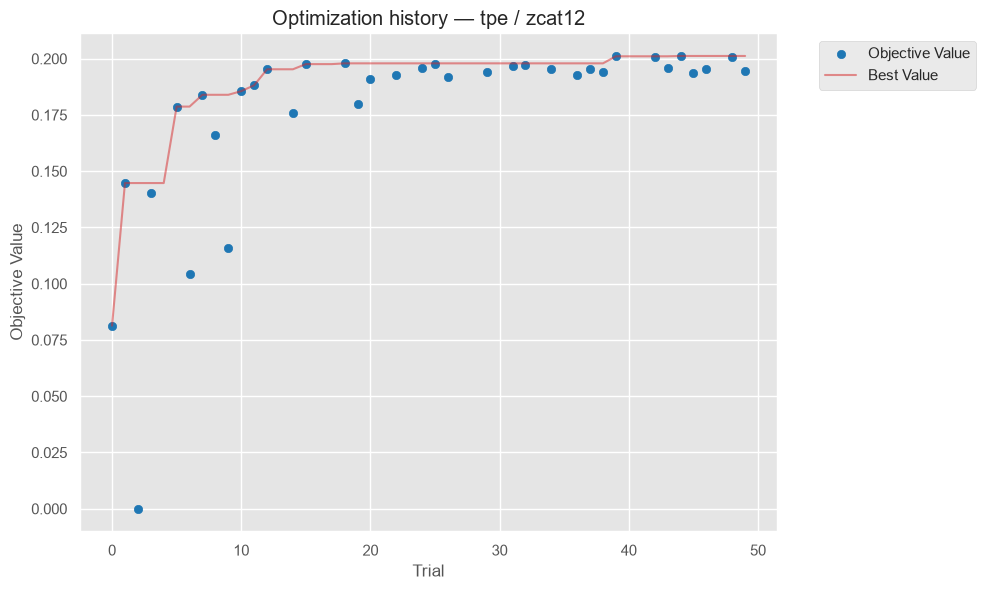

Analizando: zcat12 | gp  (gp_zcat12_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


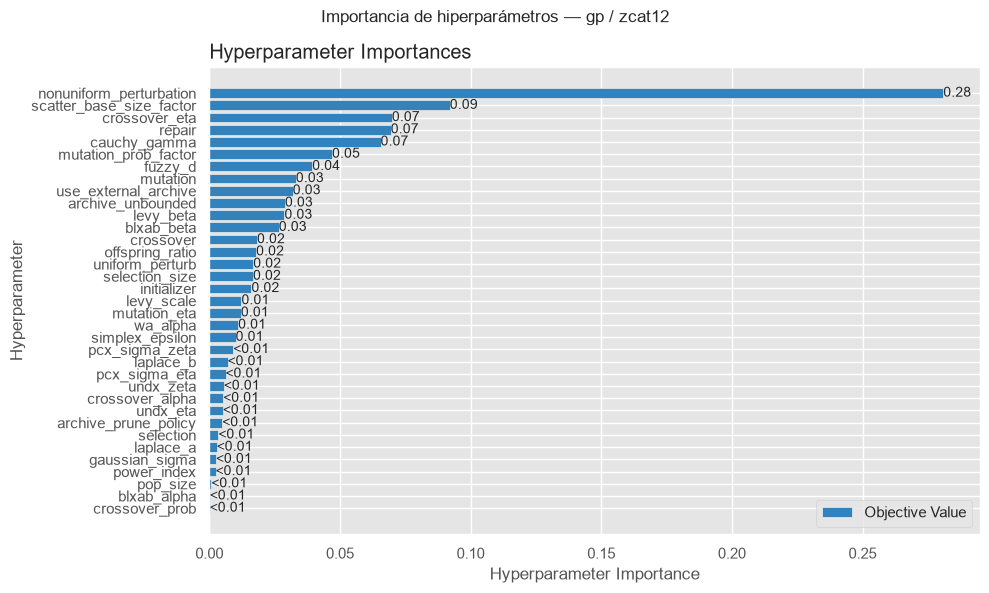

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


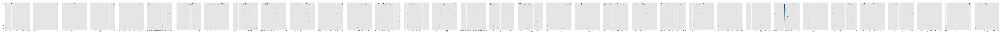

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


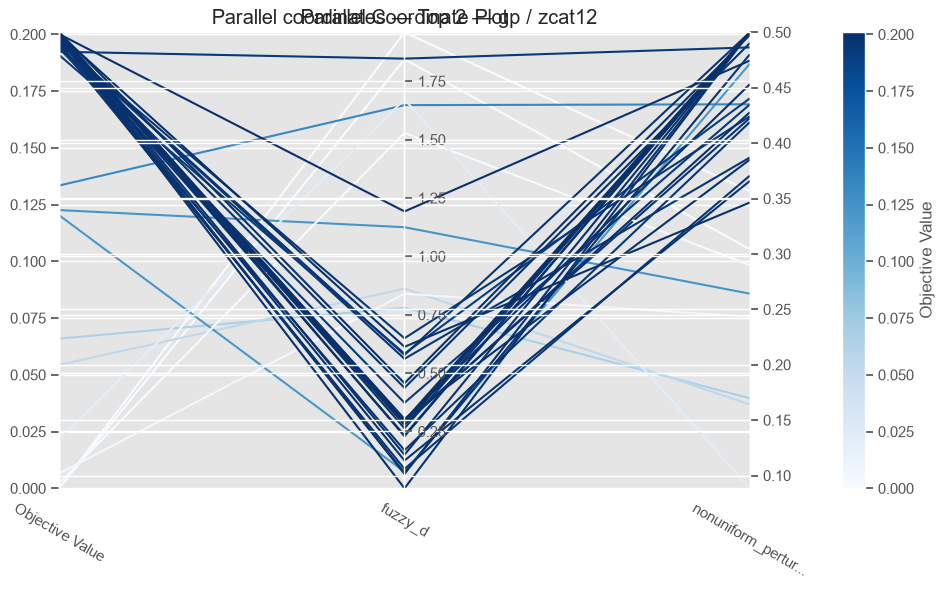

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


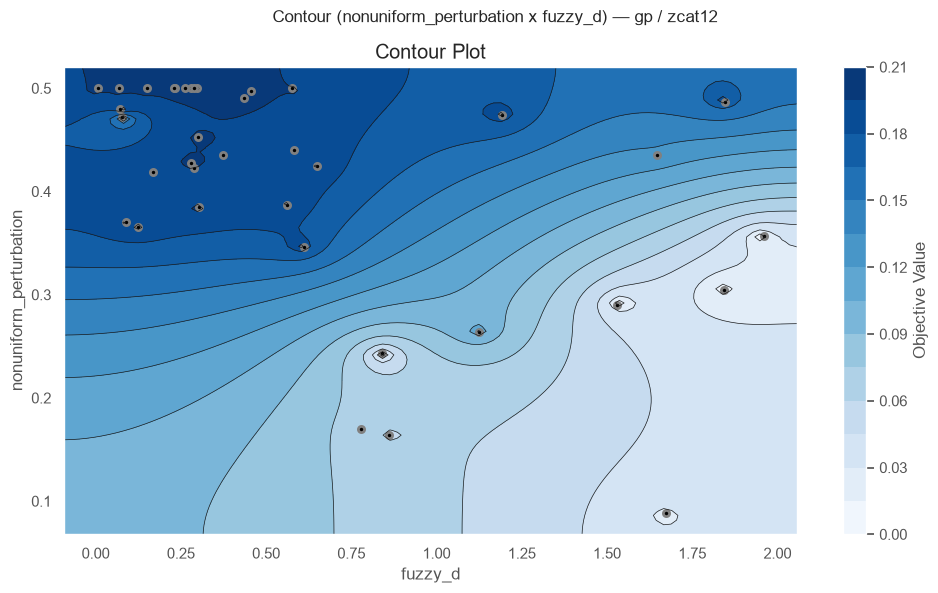

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


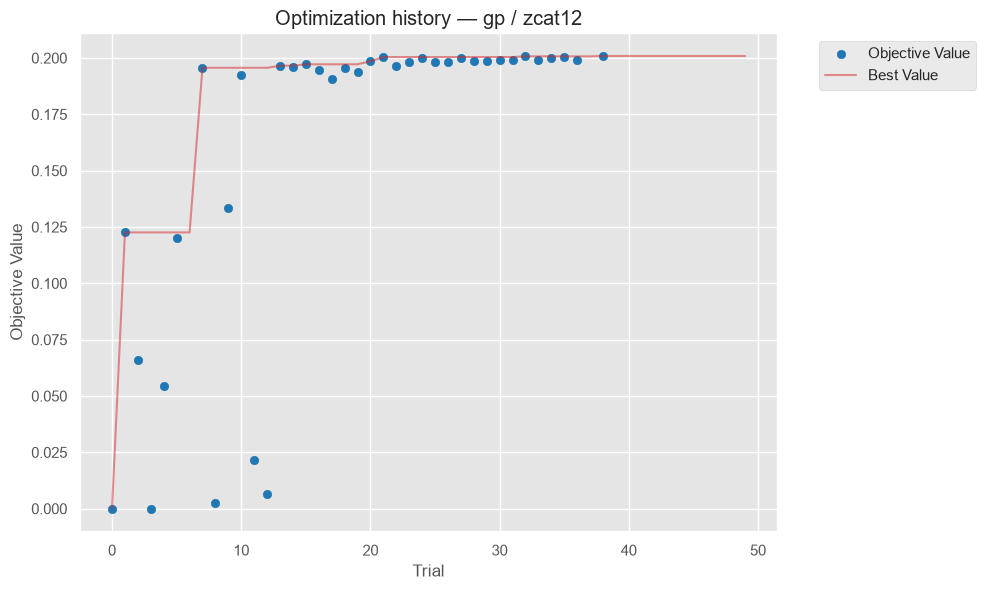

Analizando: zcat13 | qmc  (qmc_zcat13_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


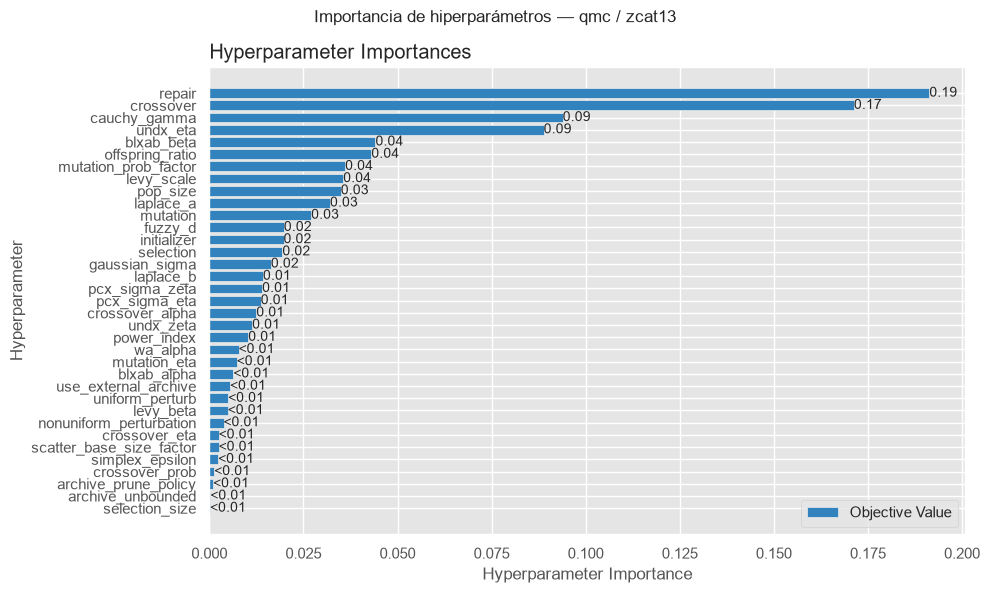

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


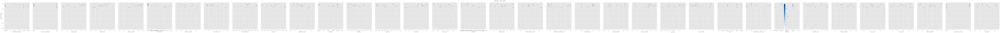

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


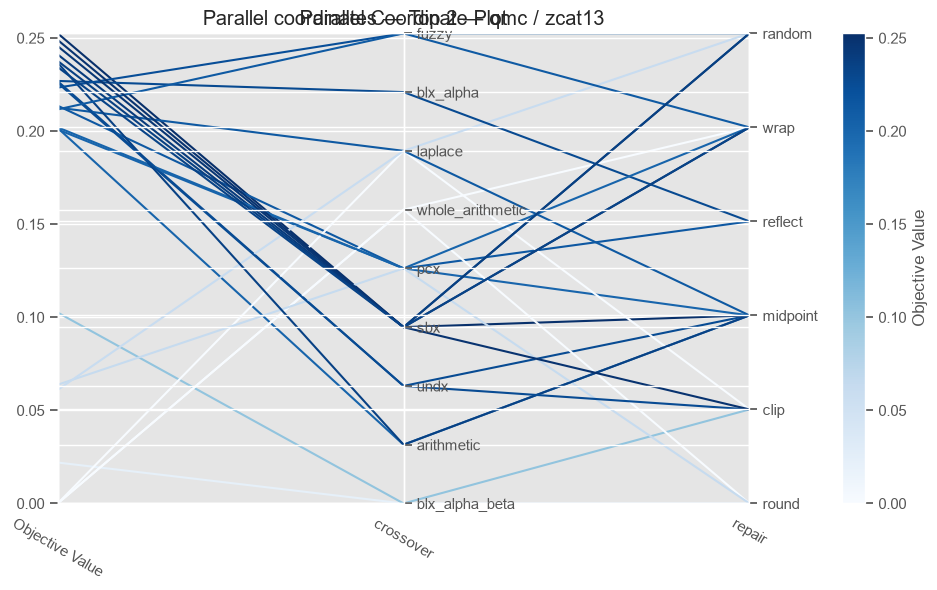

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


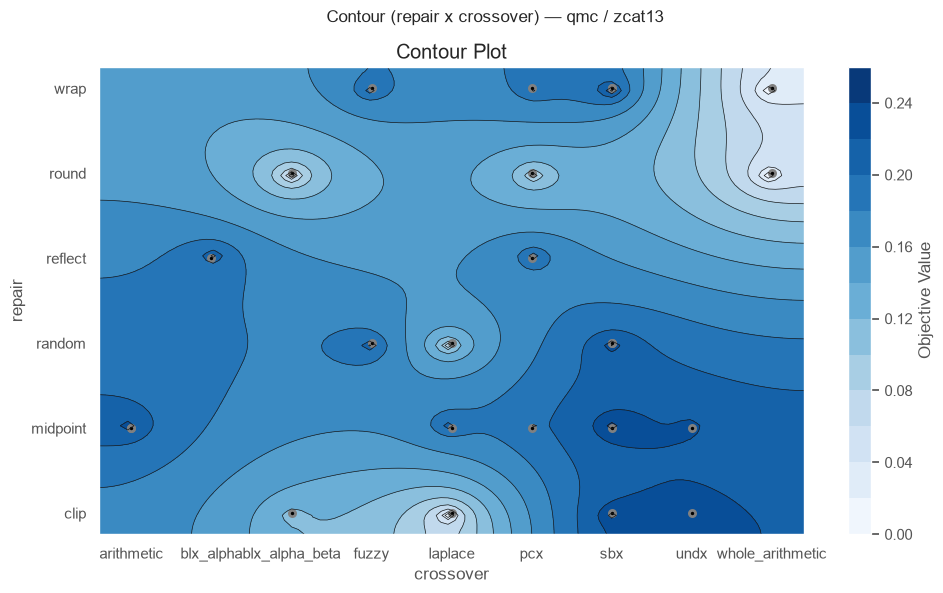

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


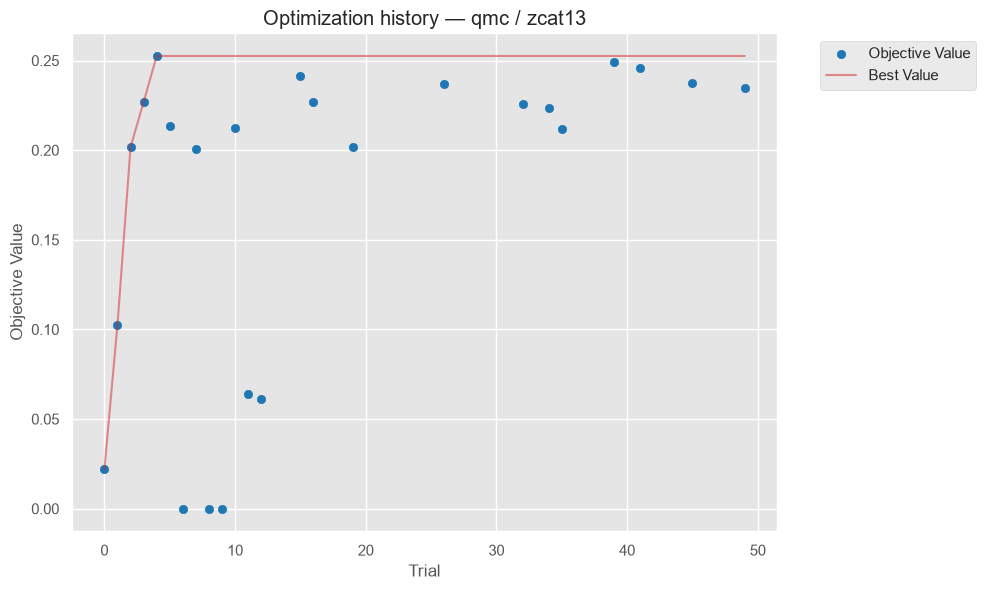

Analizando: zcat13 | nsgaii  (nsgaii_zcat13_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


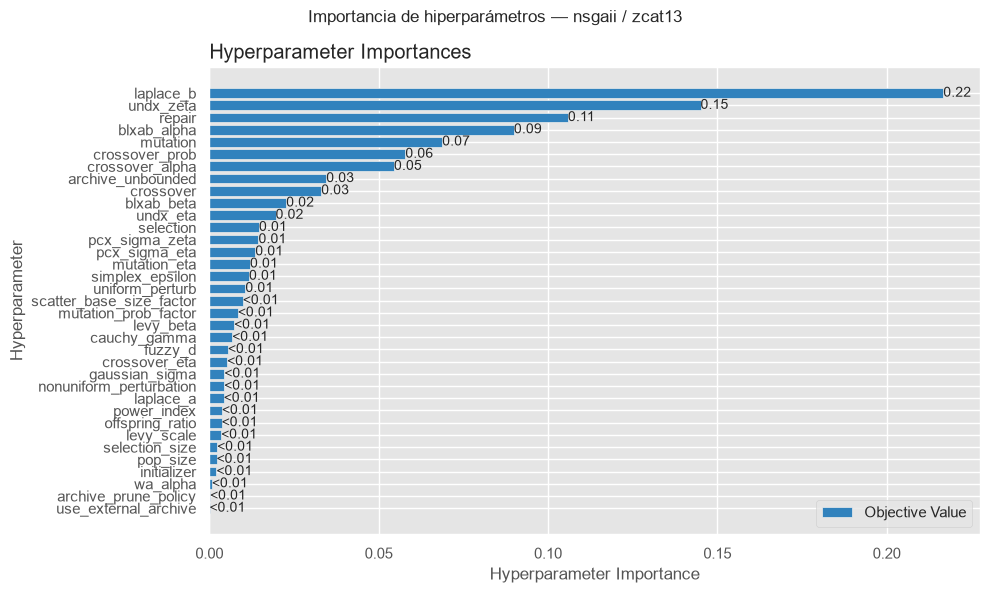

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


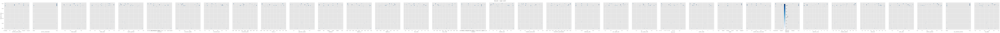

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


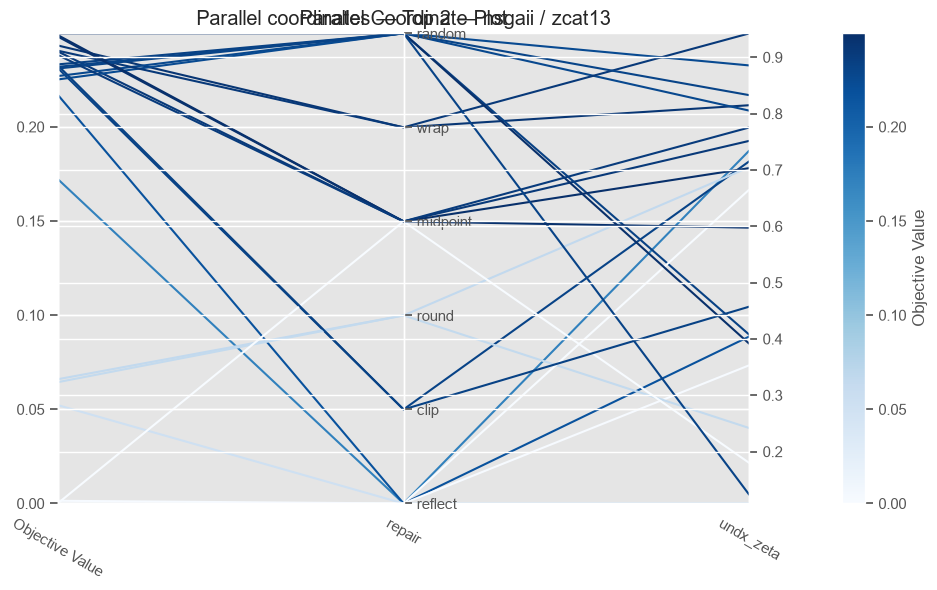

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


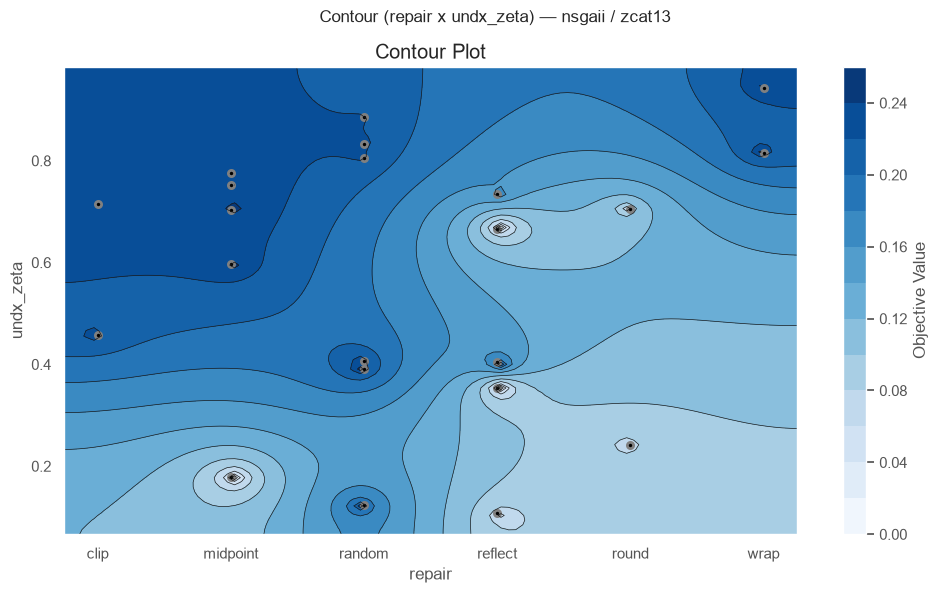

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


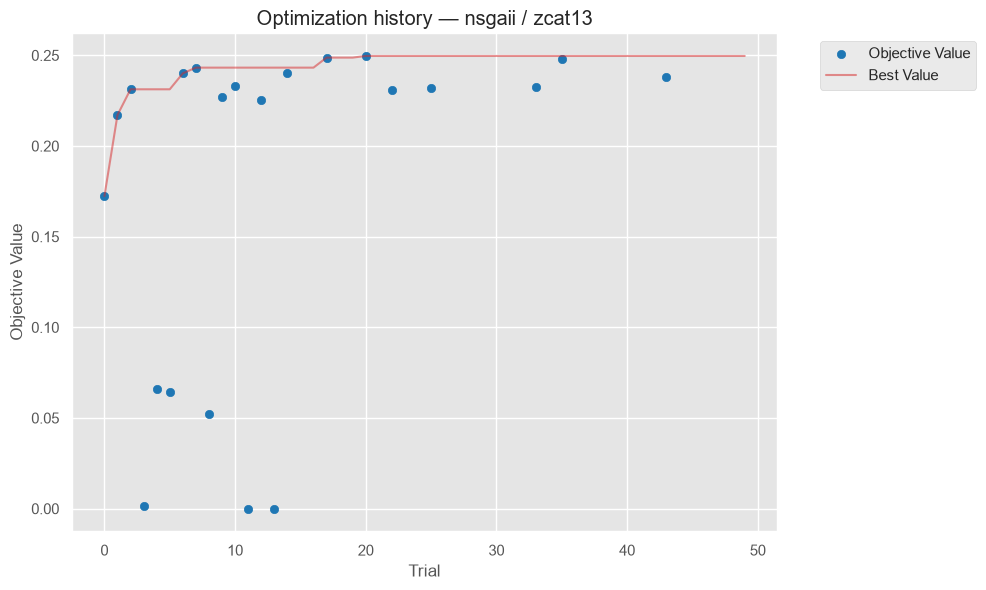

Analizando: zcat14 | tpe  (tpe_zcat14_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


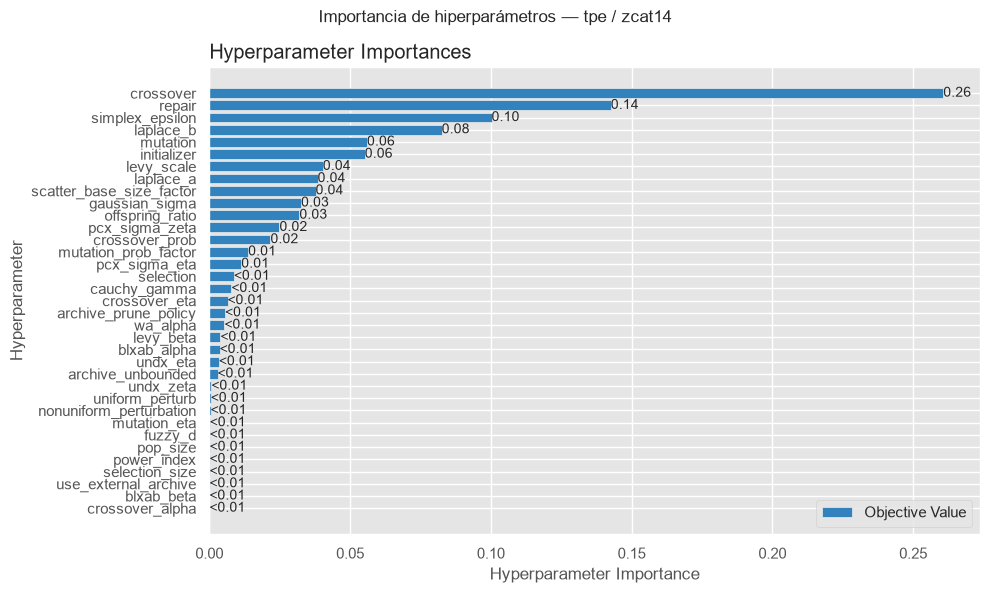

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


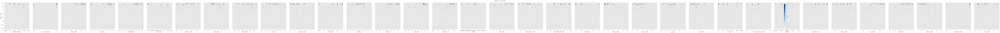

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


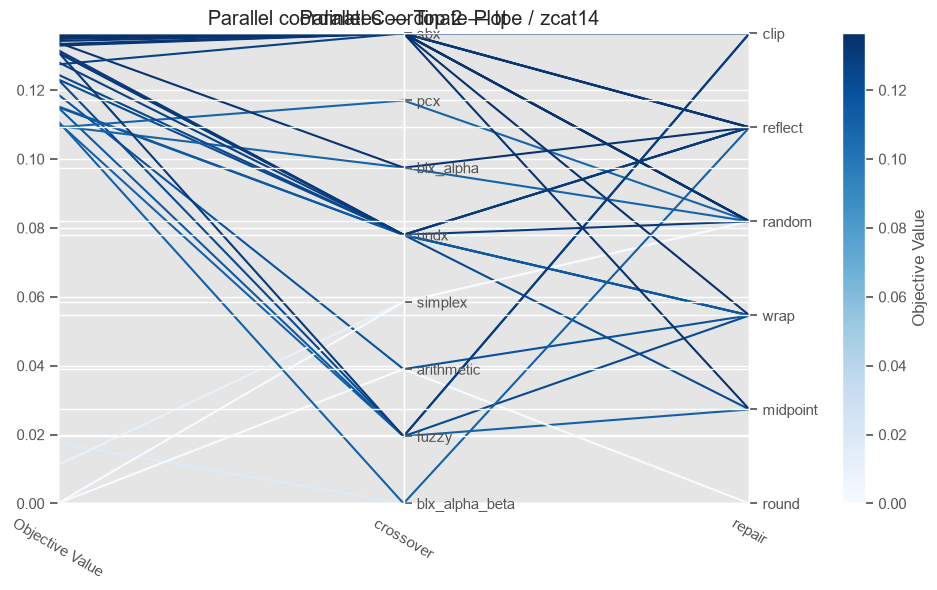

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


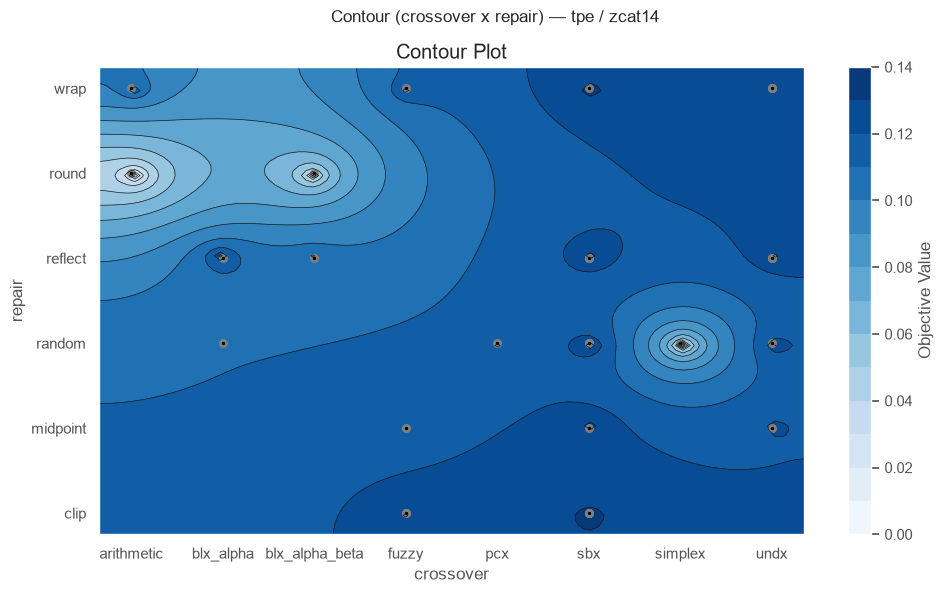

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


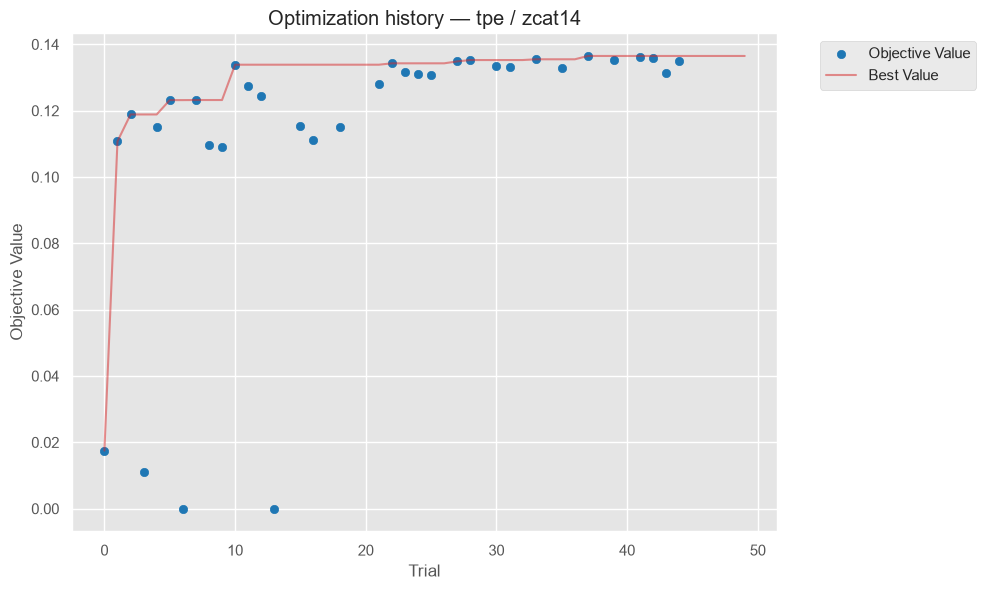

Analizando: zcat14 | qmc  (qmc_zcat14_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


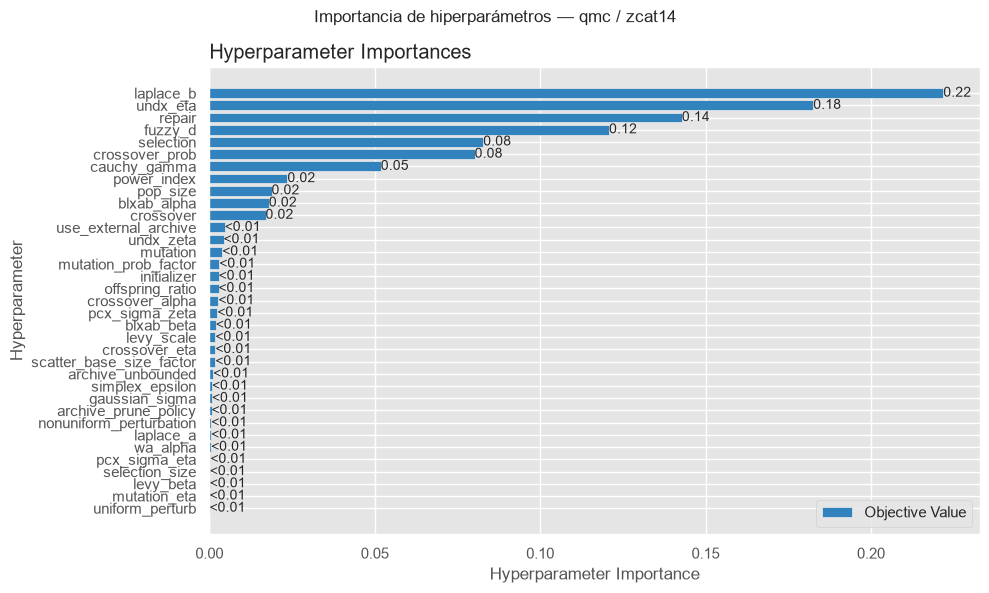

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


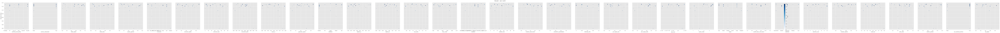

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:81: ExperimentalWarning: optuna.visualization.matplotlib._parallel_coordinate.plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_parallel_coordinate(


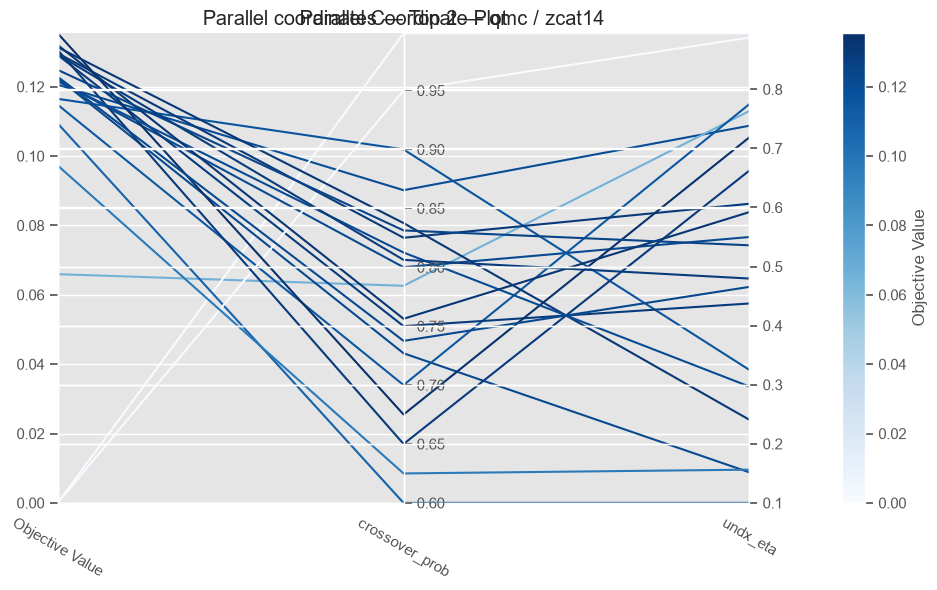

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:107: ExperimentalWarning: optuna.visualization.matplotlib._contour.plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)


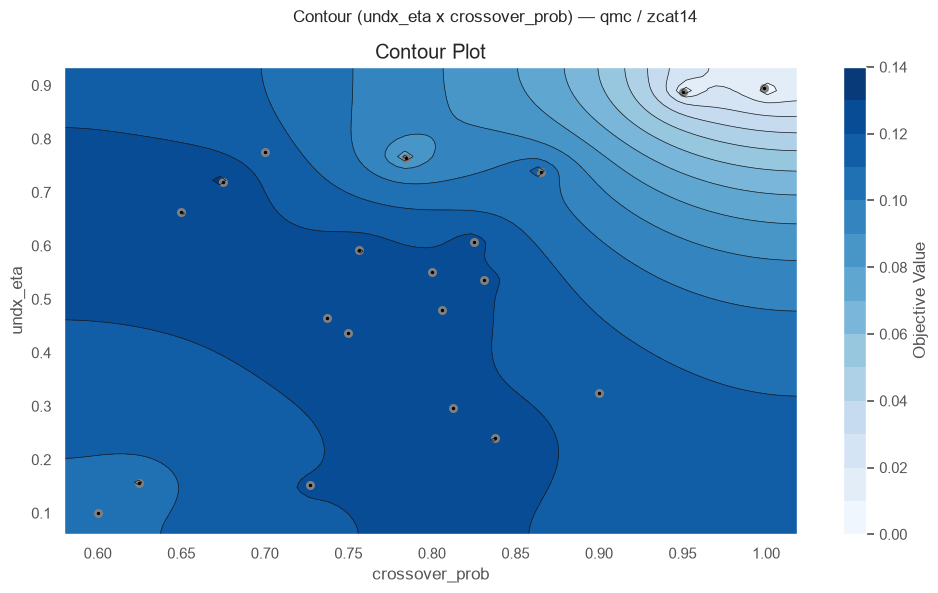

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:117: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_optimization_history(study)


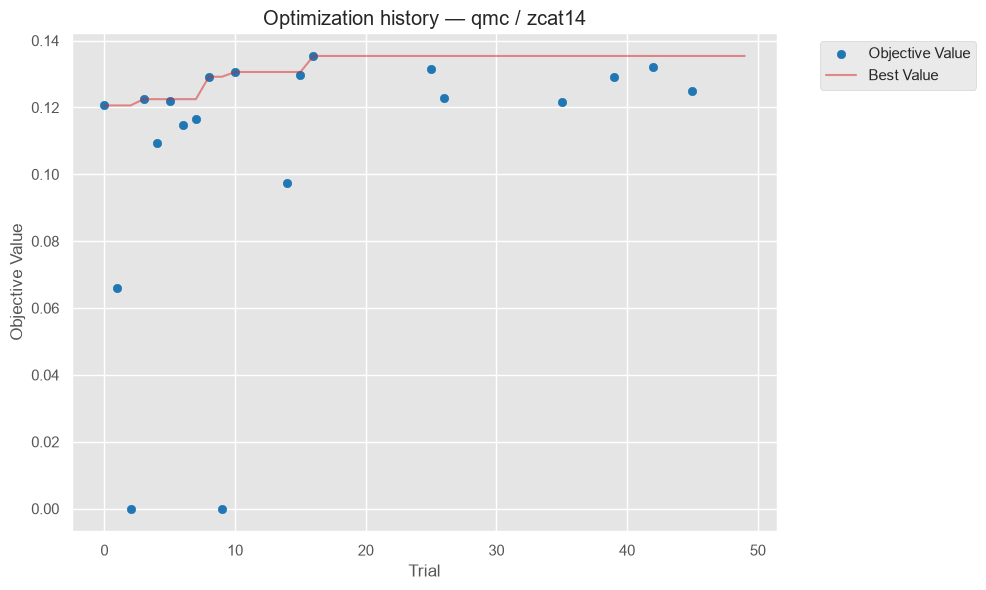

Analizando: zcat15 | gp  (gp_zcat15_s3)


C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:59: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_param_importances(study)


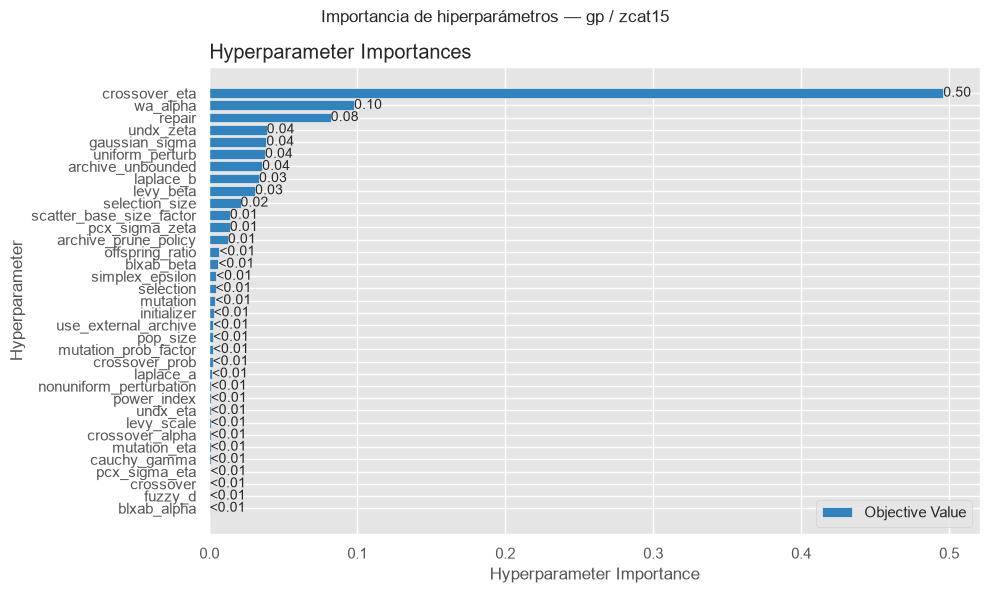

C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:69: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  fig = optuna.visualization.matplotlib.plot_slice(study)
C:\Users\ramir\AppData\Local\Temp\ipykernel_4004\1322330170.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


KeyboardInterrupt: 

In [ ]:
def basic_study_info(study, problem, sampler):
    trials = study.trials
    completed = [t for t in trials if t.state == optuna.trial.TrialState.COMPLETE]
    durations = [
        (t.datetime_complete - t.datetime_start).total_seconds()
        for t in completed
        if t.datetime_complete is not None and t.datetime_start is not None
    ]
    info = {
        "problem": problem,
        "sampler": sampler,
        "study_name": study.study_name,
        "n_trials_total": len(trials),
        "n_trials_completed": len(completed),
        "best_hv": study.best_value if completed else np.nan,
        "mean_trial_duration_s": np.mean(durations) if durations else np.nan,
        "total_duration_s": np.sum(durations) if durations else np.nan,
    }
    return info


def safe_get_importances(study):
    """fANOVA puede fallar si hay muy pocos trials o hiperparámetros constantes."""
    try:
        return get_param_importances(study, evaluator=FanovaImportanceEvaluator())
    except Exception as e:
        print(f"  [aviso] fANOVA no disponible para '{study.study_name}': {e}")
        return {}


study_infos = []
importances_records = []   # una fila por (problem, sampler, param, importance)

for _, row in selected_studies.iterrows():
    problem, sampler = row[COL_PROBLEM], row[COL_SAMPLER]
    study_name = row["study_name"]
    print(f"Analizando: {problem} | {sampler}  ({study_name})")

    study = optuna.load_study(study_name=study_name, storage=STORAGE)

    info = basic_study_info(study, problem, sampler)
    study_infos.append(info)

    importances = safe_get_importances(study)
    for param, imp in importances.items():
        importances_records.append({
            "problem": problem, "sampler": sampler, "param": param, "importance": imp
        })

    if not importances:
        continue

    top2_params = list(importances.keys())[:2]

    try:
        fig = optuna.visualization.matplotlib.plot_param_importances(study)
        fig.figure.suptitle(f"Importancia de hiperparámetros — {sampler} / {problem}")
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / f"importance_{sampler}_{problem}.png", dpi=120)
        plt.show()
        plt.close()
    except Exception as e:
        print(f"  [aviso] plot_param_importances falló: {e}")

    try:
        fig = optuna.visualization.matplotlib.plot_slice(study)
        plt.suptitle(f"Slice plot — {sampler} / {problem}")
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / f"slice_{sampler}_{problem}.png", dpi=120)
        plt.show()
        plt.close()
    except Exception as e:
        print(f"  [aviso] plot_slice falló: {e}")

    try:
        if len(top2_params) == 2:
            fig = optuna.visualization.matplotlib.plot_parallel_coordinate(
                study,
                params=top2_params
            )
            plt.suptitle(f"Parallel coordinates ({top2_params[0]} x {top2_params[1]}) — {sampler} / {problem}")
            plt.tight_layout()
            plt.savefig(
                OUTPUT_DIR / f"parallel_{sampler}_{problem}.png",
                dpi=120
            )
            plt.show()
            plt.close()
        else:
            print(
                f"  [aviso] No hay al menos 2 hiperparámetros "
                f"para parallel coordinates en '{study.study_name}'"
            )

    except Exception as e:
        print(f"  [aviso] plot_parallel_coordinate falló: {e}")



    if len(top2_params) == 2:
        try:
            fig = optuna.visualization.matplotlib.plot_contour(study, params=top2_params)
            plt.suptitle(f"Contour ({top2_params[0]} x {top2_params[1]}) — {sampler} / {problem}")
            plt.tight_layout()
            plt.savefig(OUTPUT_DIR / f"contour_{sampler}_{problem}.png", dpi=120)
            plt.show()
            plt.close()
        except Exception as e:
            print(f"  [aviso] plot_contour falló: {e}")

    try:
        fig = optuna.visualization.matplotlib.plot_optimization_history(study)
        plt.title(f"Optimization history — {sampler} / {problem}")
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / f"history_{sampler}_{problem}.png", dpi=120)
        plt.show()
        plt.close()
    except Exception as e:
        print(f"  [aviso] plot_optimization_history falló: {e}")

study_infos_df = pd.DataFrame(study_infos)
importances_df = pd.DataFrame(importances_records)

study_infos_df.to_csv(OUTPUT_DIR / "study_infos.csv", index=False)
importances_df.to_csv(OUTPUT_DIR / "param_importances_per_study.csv", index=False)

study_infos_df


## Bloque 3 — DataFrame global de *trials*

En lugar de seguir estudiando cada estudio de forma individual, se construye **un único DataFrame** en el que cada fila es un *trial* de cualquiera de los 40 estudios seleccionados. Esta tabla, obtenida a partir de `study.trials_dataframe()`, es la base de todo el análisis transversal del Bloque 4 y probablemente la tabla más valiosa de todo el TFM.


In [11]:

all_trials_frames = []

for _, row in selected_studies.iterrows():
    problem, sampler, study_name = row[COL_PROBLEM], row[COL_SAMPLER], row["study_name"]
    study = optuna.load_study(study_name=study_name, storage=STORAGE)

    tdf = study.trials_dataframe(attrs=("number", "value", "state", "params", "user_attrs", "duration"))
    tdf = tdf[tdf["state"] == "COMPLETE"].copy()

    tdf.insert(0, "problem", problem)
    tdf.insert(1, "sampler", sampler)
    tdf.insert(2, "local_rank", row["local_rank"])

    # homogeneizar el nombre de la columna objetivo
    if "value" in tdf.columns:
        tdf.rename(columns={"value": "hv"}, inplace=True)

    all_trials_frames.append(tdf)

trials_df = pd.concat(all_trials_frames, ignore_index=True)

# limpiar el prefijo "params_" de las columnas de hiperparámetros para comodidad
param_cols = [c for c in trials_df.columns if c.startswith("params_")]
rename_map = {c: c.replace("params_", "") for c in param_cols}
trials_df.rename(columns=rename_map, inplace=True)
param_cols = list(rename_map.values())

trials_df.to_csv(OUTPUT_DIR / "all_trials_global.csv", index=False)

print(f"DataFrame global: {trials_df.shape[0]} trials x {trials_df.shape[1]} columnas")
print(f"Hiperparámetros detectados: {param_cols}")
trials_df.head()


DataFrame global: 1194 trials x 44 columnas
Hiperparámetros detectados: ['archive_prune_policy', 'archive_unbounded', 'blxab_alpha', 'blxab_beta', 'cauchy_gamma', 'crossover', 'crossover_alpha', 'crossover_eta', 'crossover_prob', 'fuzzy_d', 'gaussian_sigma', 'initializer', 'laplace_a', 'laplace_b', 'levy_beta', 'levy_scale', 'mutation', 'mutation_eta', 'mutation_prob_factor', 'nonuniform_perturbation', 'offspring_ratio', 'pcx_sigma_eta', 'pcx_sigma_zeta', 'pop_size', 'power_index', 'repair', 'scatter_base_size_factor', 'selection', 'selection_size', 'simplex_epsilon', 'undx_eta', 'undx_zeta', 'uniform_perturb', 'use_external_archive', 'wa_alpha']


,problem,sampler,local_rank,number,hv,state,archive_prune_policy,archive_unbounded,blxab_alpha,blxab_beta,...,selection_size,simplex_epsilon,undx_eta,undx_zeta,uniform_perturb,use_external_archive,wa_alpha,user_attrs_config,user_attrs_fidelity_trace,duration
0,zcat1,nsgaii,1,0,0.246701,COMPLETE,knn,True,0.947613,0.097271,...,8,0.695689,0.112502,0.246788,0.077408,True,0.446358,"{'pop_size': 45, 'offspring_ratio': 0.25, 'sel...","[{'step': 0, 'budget': 5000, 'score': 0.165815...",0 days 00:02:24.877823
1,zcat1,nsgaii,1,1,0.202684,COMPLETE,hv,True,0.176573,0.040074,...,9,0.663976,0.929427,0.360103,0.198537,False,0.937622,"{'pop_size': 22, 'offspring_ratio': 1.0, 'sele...","[{'step': 0, 'budget': 5000, 'score': 0.054676...",0 days 00:00:40.107198
2,zcat1,nsgaii,1,2,0.000000,COMPLETE,knn,True,0.238974,0.261324,...,7,0.335033,0.169739,0.994495,0.454376,False,0.419320,"{'pop_size': 48, 'offspring_ratio': 0.5, 'sele...","[{'step': 0, 'budget': 5000, 'score': 0.0, 'in...",0 days 00:00:50.186908
3,zcat1,nsgaii,1,3,0.000000,COMPLETE,hv,False,0.408408,0.347728,...,7,0.798676,0.894361,0.620574,0.270934,False,0.763417,"{'pop_size': 170, 'offspring_ratio': 1.0, 'sel...","[{'step': 0, 'budget': 5000, 'score': 0.0, 'in...",0 days 00:00:25.359026
4,zcat1,nsgaii,1,4,0.237279,COMPLETE,hv,False,0.075754,0.182891,...,2,0.530547,0.448878,0.209186,0.044631,True,0.696748,"{'pop_size': 39, 'offspring_ratio': 0, 'select...","[{'step': 0, 'budget': 5000, 'score': 0.214654...",0 days 00:05:18.756541


In [12]:

# separar hiperparámetros numéricos y categóricos para el resto del análisis
numeric_params = [
    c for c in param_cols
    if pd.api.types.is_numeric_dtype(trials_df[c])
]
categorical_params = [c for c in param_cols if c not in numeric_params]

print("Numéricos:   ", numeric_params)
print("Categóricos: ", categorical_params)


Numéricos:    ['archive_unbounded', 'blxab_alpha', 'blxab_beta', 'cauchy_gamma', 'crossover_alpha', 'crossover_eta', 'crossover_prob', 'fuzzy_d', 'gaussian_sigma', 'laplace_a', 'laplace_b', 'levy_beta', 'levy_scale', 'mutation_eta', 'mutation_prob_factor', 'nonuniform_perturbation', 'offspring_ratio', 'pcx_sigma_eta', 'pcx_sigma_zeta', 'pop_size', 'power_index', 'scatter_base_size_factor', 'selection_size', 'simplex_epsilon', 'undx_eta', 'undx_zeta', 'uniform_perturb', 'use_external_archive', 'wa_alpha']
Categóricos:  ['archive_prune_policy', 'crossover', 'initializer', 'mutation', 'repair', 'selection']


## Bloque 4 — Análisis transversal

A partir de aquí ya no interesa el problema de forma aislada, sino los **patrones que se repiten** a lo largo de toda la suite ZCAT.

1. Importancia media de cada hiperparámetro.
2. *Heatmap* problema × hiperparámetro.
3. *Boxplots* de estabilidad de la importancia.
4. Frecuencia de operadores categóricos.
5. Distribución de los hiperparámetros numéricos.
6. Análisis del top 10 % de los *trials*.
7. Correlaciones de Spearman con el HV.
8. Interacciones entre pares de hiperparámetros.
9. Configuración maestra recomendada.


### 4.1 Importancia media de cada hiperparámetro

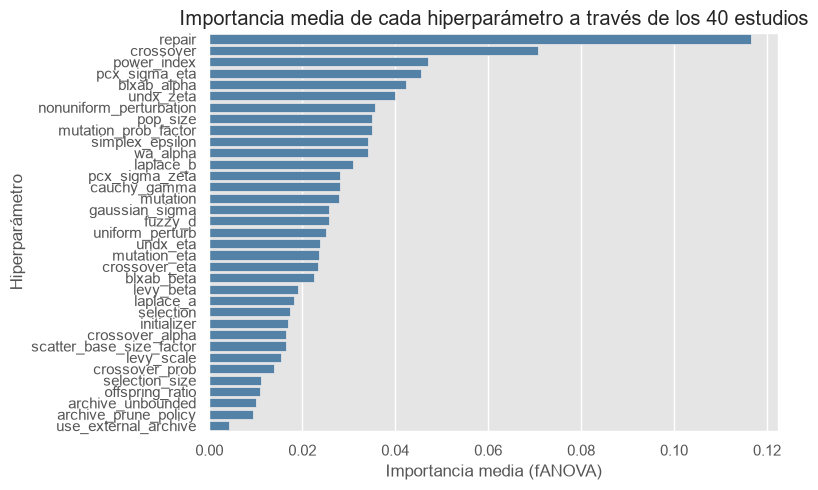

param
repair                      0.116618
crossover                   0.070682
power_index                 0.046955
pcx_sigma_eta               0.045539
blxab_alpha                 0.042289
undx_zeta                   0.039856
nonuniform_perturbation     0.035635
pop_size                    0.035083
mutation_prob_factor        0.034935
simplex_epsilon             0.034049
wa_alpha                    0.034033
laplace_b                   0.030991
pcx_sigma_zeta              0.028002
cauchy_gamma                0.028000
mutation                    0.027983
gaussian_sigma              0.025831
fuzzy_d                     0.025742
uniform_perturb             0.025078
undx_eta                    0.023823
mutation_eta                0.023604
crossover_eta               0.023339
blxab_beta                  0.022539
levy_beta                   0.019015
laplace_a                   0.018193
selection                   0.017317
initializer                 0.016823
crossover_alpha             0.01

In [13]:

mean_importance = (
    importances_df.groupby("param")["importance"]
    .mean()
    .sort_values(ascending=False)
)

plt.figure(figsize=(8, 5))
sns.barplot(x=mean_importance.values, y=mean_importance.index, color="steelblue")
plt.xlabel("Importancia media (fANOVA)")
plt.ylabel("Hiperparámetro")
plt.title("Importancia media de cada hiperparámetro a través de los 40 estudios")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "mean_importance.png", dpi=120)
plt.show()

mean_importance


### 4.2 Heatmap problema × hiperparámetro

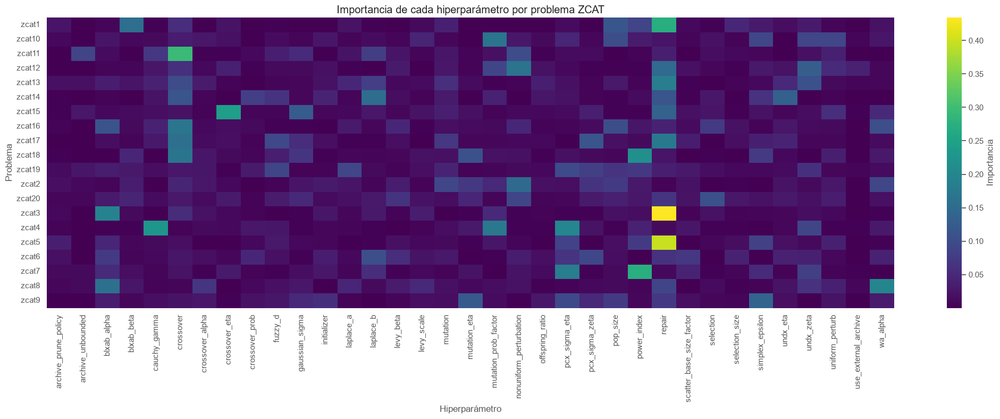

param,archive_prune_policy,archive_unbounded,blxab_alpha,blxab_beta,cauchy_gamma,crossover,crossover_alpha,crossover_eta,crossover_prob,fuzzy_d,...,repair,scatter_base_size_factor,selection,selection_size,simplex_epsilon,undx_eta,undx_zeta,uniform_perturb,use_external_archive,wa_alpha
problem,,,,,,,,,,,,,,,,,,,,,
zcat1,0.022930,0.000608,0.006641,0.154903,0.003092,0.055802,0.001090,0.021558,0.000951,0.003128,...,0.271823,0.008707,0.002600,0.046456,0.030529,0.014960,0.029777,0.005196,0.000719,0.020304
zcat10,0.009714,0.000022,0.022478,0.009808,0.011403,0.033382,0.025607,0.017267,0.001718,0.011954,...,0.022283,0.006229,0.019260,0.004045,0.091742,0.000699,0.090524,0.091441,0.006748,0.025440
zcat11,0.000333,0.087072,0.011914,0.001398,0.069336,0.293596,0.003272,0.002541,0.009405,0.036494,...,0.036803,0.000707,0.013880,0.009837,0.007514,0.000616,0.017905,0.037354,0.000031,0.000174
zcat12,0.000795,0.000071,0.005716,0.006354,0.025175,0.060281,0.009849,0.038018,0.003219,0.011828,...,0.147670,0.018580,0.007075,0.002844,0.028085,0.020843,0.128887,0.052586,0.039886,0.008331
zcat13,0.017347,0.017367,0.034520,0.022972,0.039302,0.098937,0.031872,0.003846,0.001352,0.005480,...,0.183017,0.002983,0.001628,0.004196,0.009137,0.048903,0.107574,0.011078,0.006607,0.007949
zcat14,0.002225,0.000309,0.004459,0.000921,0.021218,0.113002,0.005491,0.000748,0.078624,0.064161,...,0.114096,0.002976,0.026652,0.001626,0.062666,0.131692,0.000151,0.004014,0.000863,0.001609
zcat15,0.002399,0.026101,0.008649,0.012731,0.016964,0.020184,0.004932,0.241198,0.005322,0.005898,...,0.135492,0.017874,0.022283,0.003198,0.019544,0.007000,0.014629,0.056104,0.002015,0.049321
zcat16,0.004440,0.001405,0.111166,0.011622,0.040451,0.168846,0.008914,0.013965,0.011532,0.002897,...,0.039224,0.012611,0.071949,0.019355,0.004380,0.026621,0.011947,0.011362,0.000165,0.102699
zcat17,0.001244,0.000096,0.014628,0.005869,0.028750,0.156089,0.012198,0.016089,0.003615,0.094131,...,0.175141,0.033262,0.000427,0.016173,0.037111,0.040829,0.007265,0.006906,0.001471,0.011951


In [14]:

importance_pivot = importances_df.pivot_table(
    index="problem", columns="param", values="importance", aggfunc="mean"
)

plt.figure(figsize=(max(8, 0.6 * len(importance_pivot.columns)), 8))
sns.heatmap(importance_pivot, cmap="viridis", annot=False, cbar_kws={"label": "Importancia"})
plt.title("Importancia de cada hiperparámetro por problema ZCAT")
plt.xlabel("Hiperparámetro")
plt.ylabel("Problema")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "heatmap_problem_param.png", dpi=120)
plt.show()

importance_pivot


### 4.3 Estabilidad de la importancia entre problemas (*boxplots*)

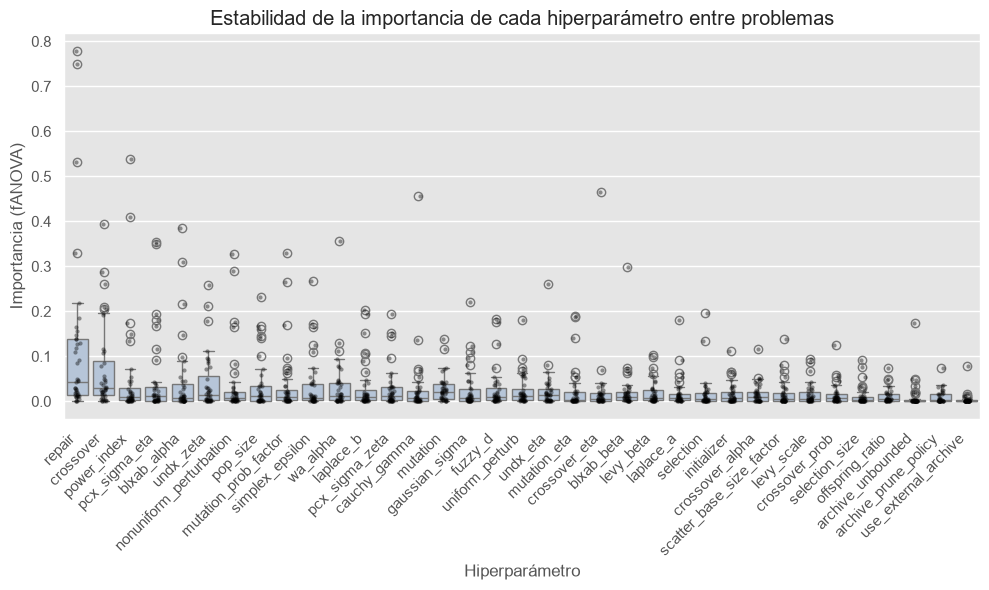

In [15]:

order = mean_importance.index.tolist()

plt.figure(figsize=(10, 6))
sns.boxplot(data=importances_df, x="param", y="importance", order=order, color="lightsteelblue")
sns.stripplot(data=importances_df, x="param", y="importance", order=order,
              color="black", alpha=0.4, size=3)
plt.xticks(rotation=45, ha="right")
plt.xlabel("Hiperparámetro")
plt.ylabel("Importancia (fANOVA)")
plt.title("Estabilidad de la importancia de cada hiperparámetro entre problemas")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "boxplot_importance_stability.png", dpi=120)
plt.show()


### 4.4 Frecuencia de operadores (hiperparámetros categóricos)

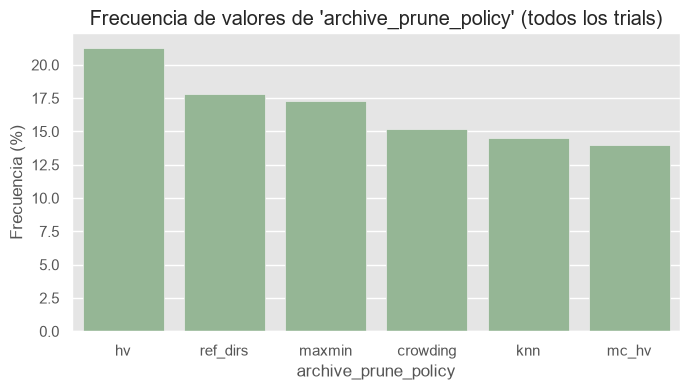


archive_prune_policy:
archive_prune_policy
hv          21.3
ref_dirs    17.8
maxmin      17.3
crowding    15.2
knn         14.5
mc_hv       14.0
Name: proportion, dtype: float64


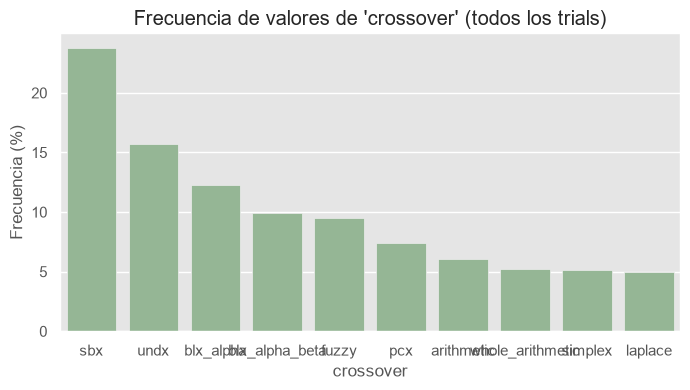


crossover:
crossover
sbx                 23.8
undx                15.7
blx_alpha           12.3
blx_alpha_beta       9.9
fuzzy                9.5
pcx                  7.4
arithmetic           6.1
whole_arithmetic     5.2
simplex              5.1
laplace              5.0
Name: proportion, dtype: float64


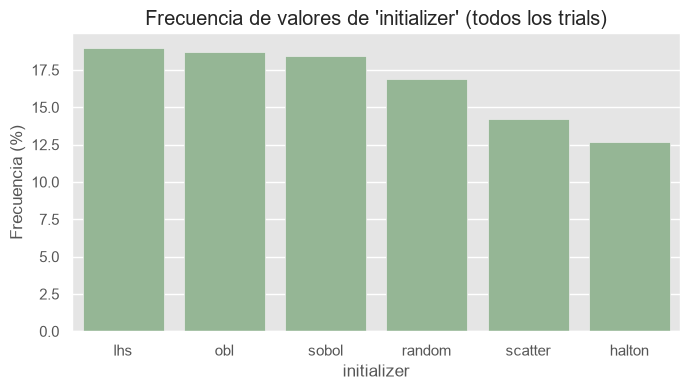


initializer:
initializer
lhs        19.0
obl        18.7
sobol      18.4
random     16.9
scatter    14.2
halton     12.7
Name: proportion, dtype: float64


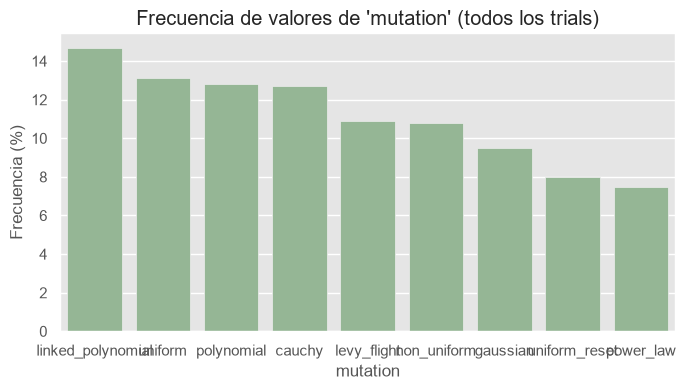


mutation:
mutation
linked_polynomial    14.7
uniform              13.1
polynomial           12.8
cauchy               12.7
levy_flight          10.9
non_uniform          10.8
gaussian              9.5
uniform_reset         8.0
power_law             7.5
Name: proportion, dtype: float64


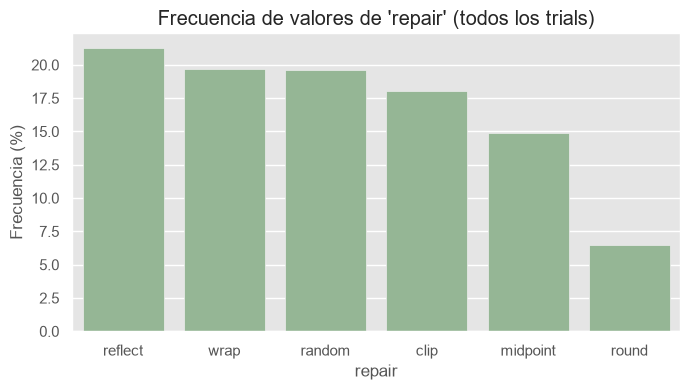


repair:
repair
reflect     21.3
wrap        19.7
random      19.6
clip        18.0
midpoint    14.9
round        6.5
Name: proportion, dtype: float64


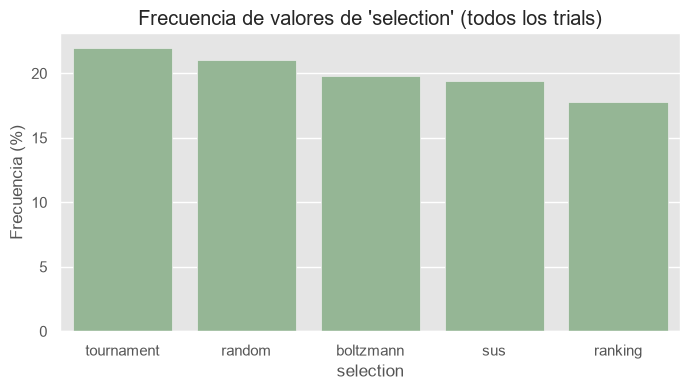


selection:
selection
tournament    22.0
random        21.0
boltzmann     19.8
sus           19.4
ranking       17.8
Name: proportion, dtype: float64


In [16]:

for cat_param in categorical_params:
    freqs = trials_df[cat_param].value_counts(normalize=True).mul(100).round(1)

    plt.figure(figsize=(7, 4))
    sns.barplot(x=freqs.index, y=freqs.values, color="darkseagreen")
    plt.ylabel("Frecuencia (%)")
    plt.xlabel(cat_param)
    plt.title(f"Frecuencia de valores de '{cat_param}' (todos los trials)")
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / f"freq_{cat_param}.png", dpi=120)
    plt.show()

    print(f"\n{cat_param}:")
    print(freqs)


### 4.5 Distribución de los hiperparámetros numéricos

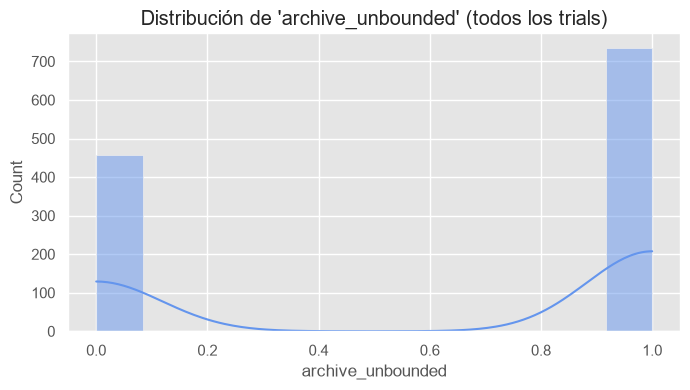

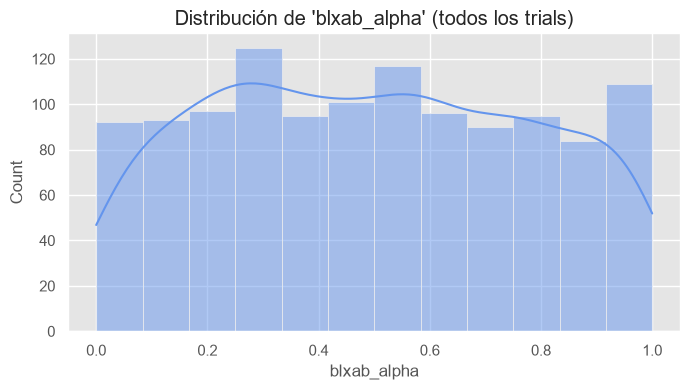

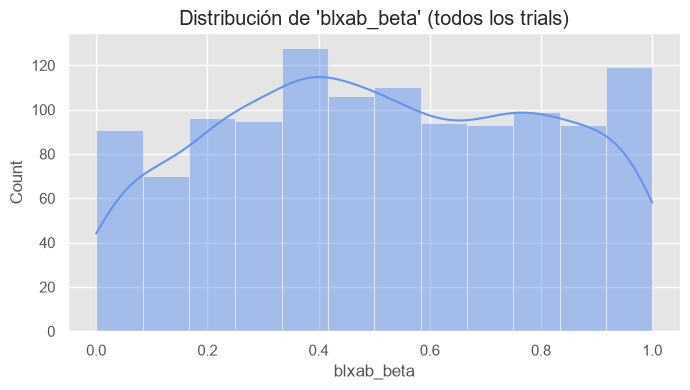

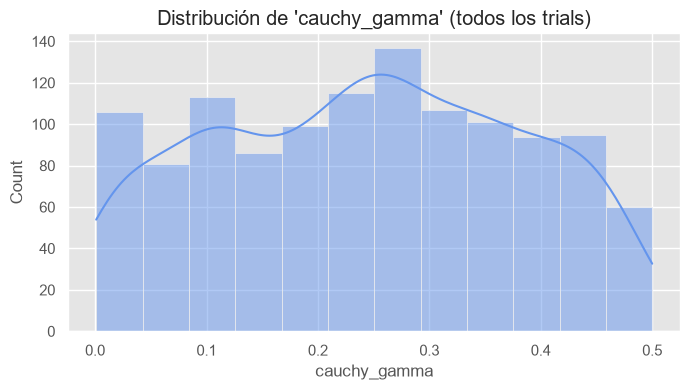

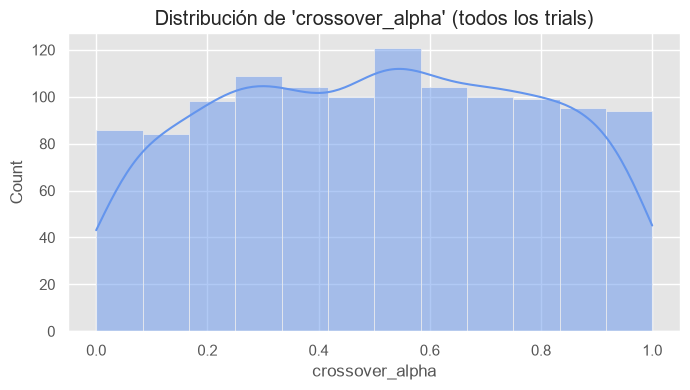

...

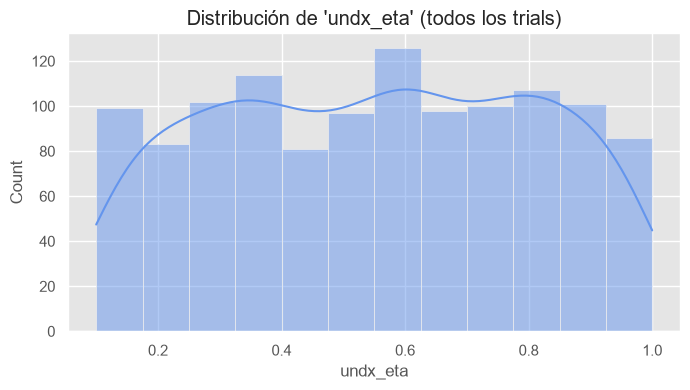

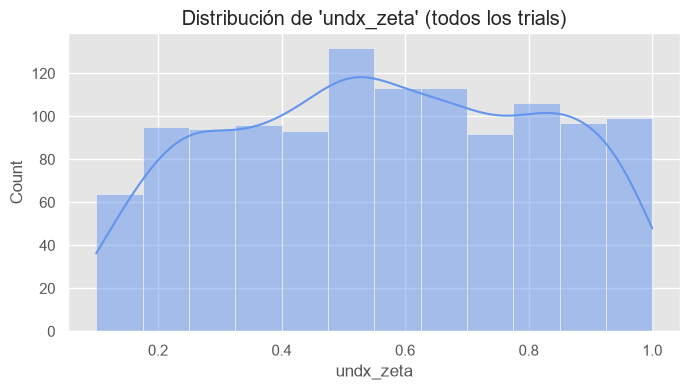

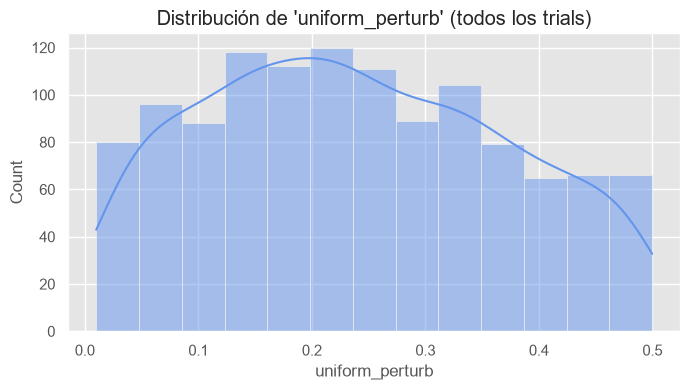

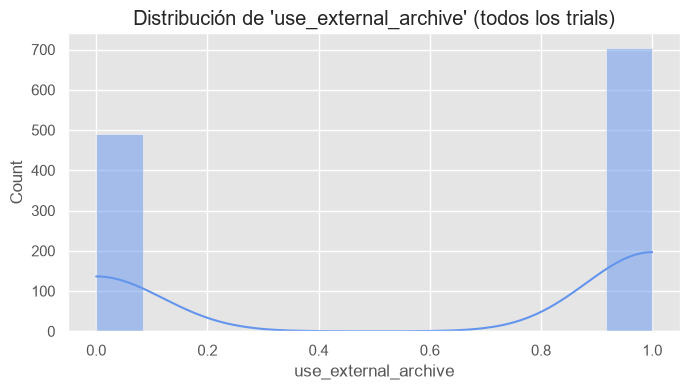

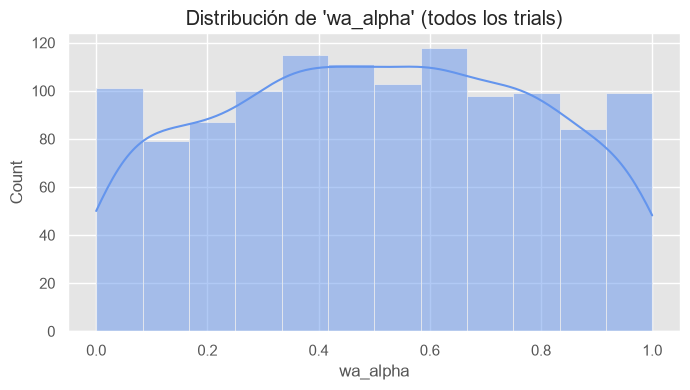

In [17]:

for num_param in numeric_params:
    plt.figure(figsize=(7, 4))
    sns.histplot(trials_df[num_param], kde=True, color="cornflowerblue")
    plt.xlabel(num_param)
    plt.title(f"Distribución de '{num_param}' (todos los trials)")
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / f"dist_{num_param}.png", dpi=120)
    plt.show()


### 4.6 Análisis del top 10 % de los *trials*

En lugar de estudiar todos los *trials*, se aíslan únicamente los mejores (percentil 90 del HV, calculado **dentro de cada combinación problema-*sampler***, para no comparar HV de problemas con escalas distintas). Esto permite responder: *¿qué valores aparecen sistemáticamente entre las mejores soluciones?*


In [18]:

def flag_top_trials(df, group_cols=("problem", "sampler"), value_col="hv", q=TOP_PERCENTILE):
    thresholds = df.groupby(list(group_cols))[value_col].transform(lambda s: s.quantile(q))
    return df[value_col] >= thresholds


trials_df["is_top"] = flag_top_trials(trials_df)
top_trials_df = trials_df[trials_df["is_top"]].copy()

print(f"Trials totales: {len(trials_df)}  |  Trials en el top 10%: {len(top_trials_df)}")

print("\n--- Valores más frecuentes en hiperparámetros categóricos (top 10%) ---")
for cat_param in categorical_params:
    print(f"\n{cat_param}:")
    print(top_trials_df[cat_param].value_counts(normalize=True).mul(100).round(1))

print("\n--- Estadísticos descriptivos de hiperparámetros numéricos (top 10%) ---")
top_trials_df[numeric_params].describe().T


Trials totales: 1194  |  Trials en el top 10%: 136

--- Valores más frecuentes en hiperparámetros categóricos (top 10%) ---

archive_prune_policy:
archive_prune_policy
hv          25.7
maxmin      18.4
knn         16.2
crowding    14.7
ref_dirs    14.7
mc_hv       10.3
Name: proportion, dtype: float64

crossover:
crossover
sbx               63.2
undx              13.2
blx_alpha_beta     8.8
blx_alpha          8.8
fuzzy              5.9
Name: proportion, dtype: float64

initializer:
initializer
obl        20.6
random     20.6
sobol      19.1
scatter    15.4
lhs        14.0
halton     10.3
Name: proportion, dtype: float64

mutation:
mutation
linked_polynomial    29.4
polynomial           19.1
cauchy               19.1
uniform               8.8
levy_flight           7.4
gaussian              7.4
non_uniform           7.4
uniform_reset         0.7
power_law             0.7
Name: proportion, dtype: float64

repair:
repair
reflect     22.8
random      21.3
clip        20.6
wrap        18.4
m

,count,mean,std,min,25%,50%,75%,max
blxab_alpha,136.0,0.487790,0.290652,0.000,0.259134,0.426184,0.724358,1.000000
blxab_beta,136.0,0.520266,0.297589,0.000,0.290681,0.491525,0.776656,1.000000
cauchy_gamma,136.0,0.231415,0.143243,0.001,0.103404,0.225690,0.340541,0.500000
crossover_alpha,136.0,0.526489,0.272485,0.000,0.278519,0.561899,0.718355,1.000000
crossover_eta,136.0,18.672660,10.151140,5.000,9.082566,18.381023,26.937577,39.453125
crossover_prob,136.0,0.827534,0.103996,0.600,0.761224,0.838182,0.903619,1.000000
fuzzy_d,136.0,0.992055,0.536892,0.000,0.634878,0.936739,1.410499,2.000000
gaussian_sigma,136.0,0.276269,0.139615,0.001,0.155467,0.293097,0.393915,0.500000
laplace_a,136.0,-0.015456,0.538117,-1.000,-0.441343,-0.002621,0.384267,1.000000
laplace_b,136.0,0.921875,0.565938,0.010,0.500772,0.882893,1.351092,1.993165


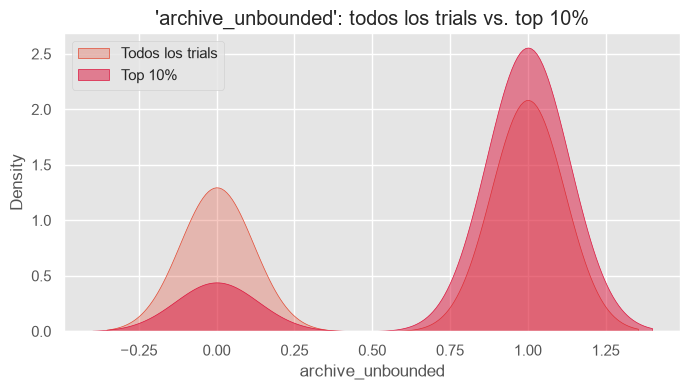

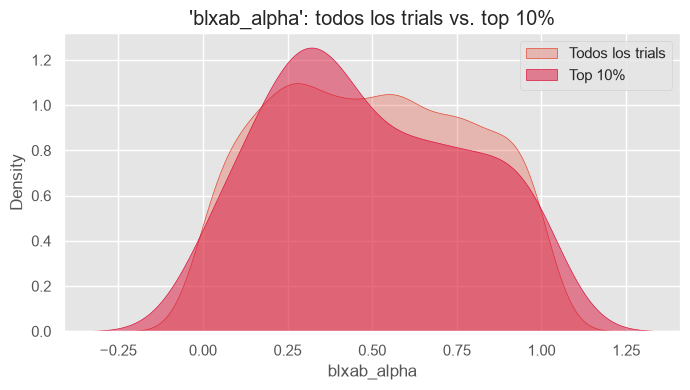

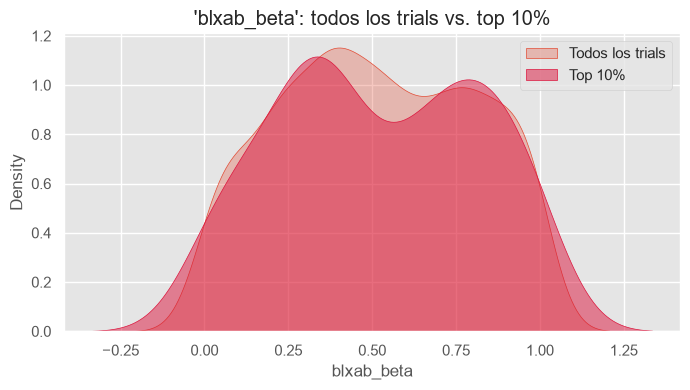

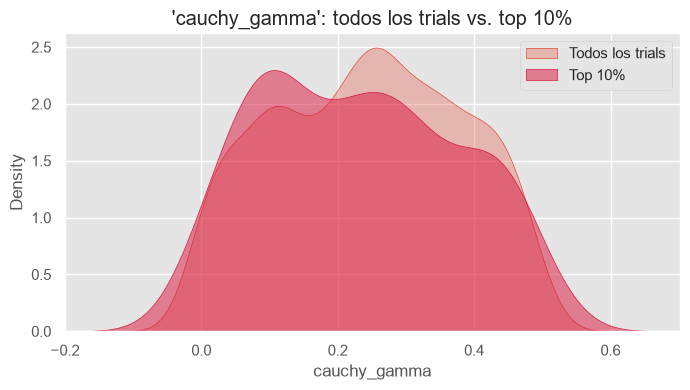

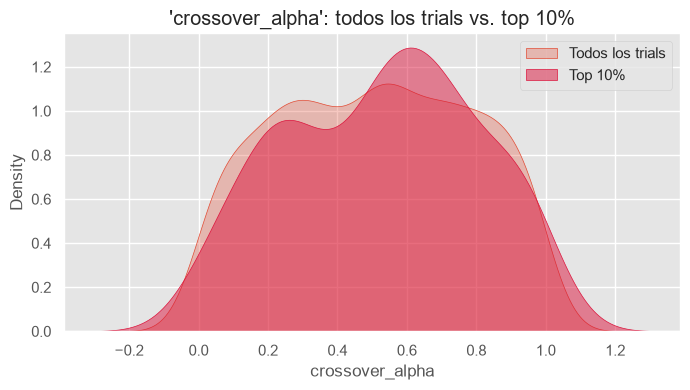

...

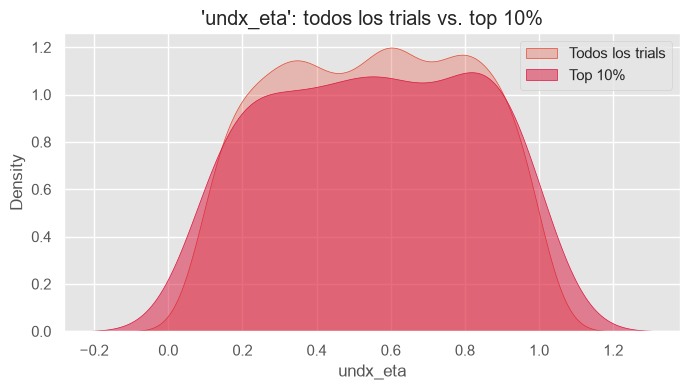

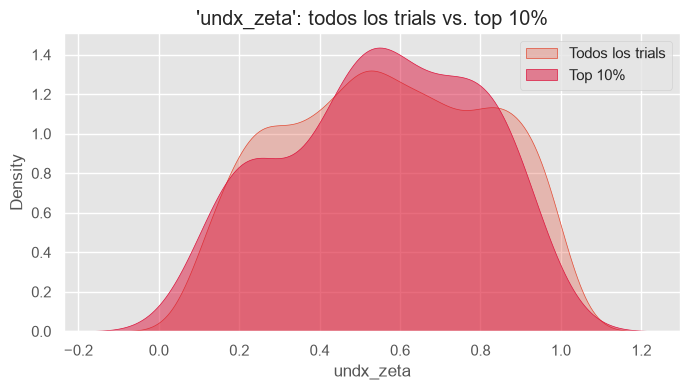

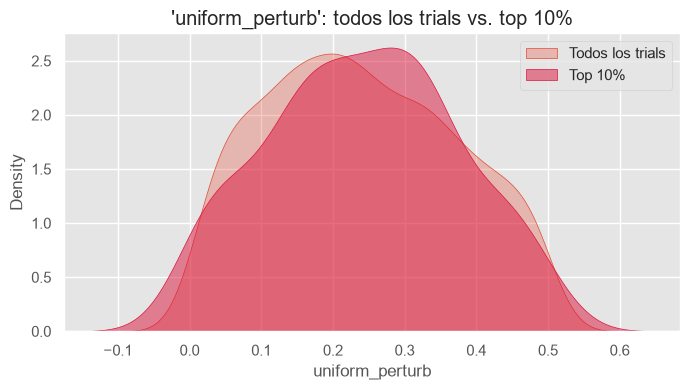

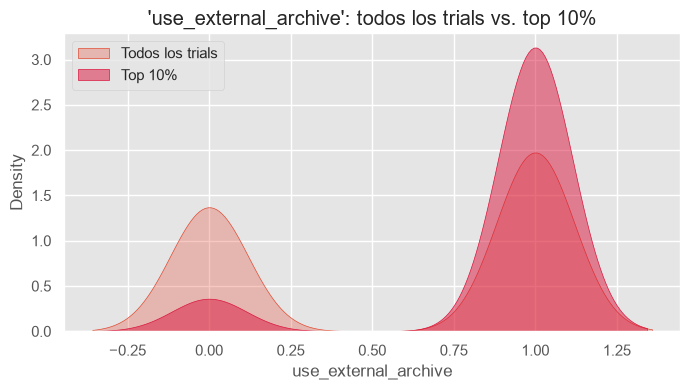

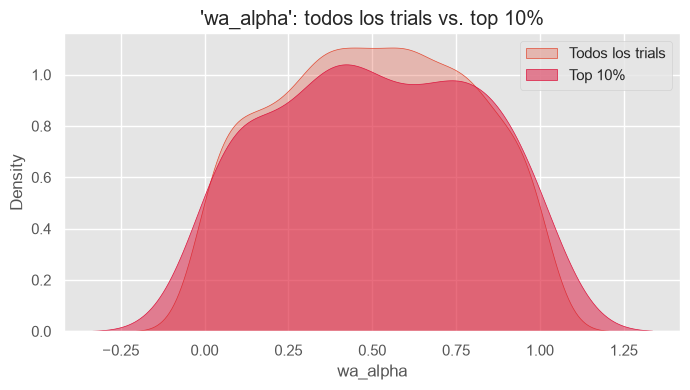

In [19]:

# comparación visual: distribución completa vs. top 10%, para cada hiperparámetro numérico
for num_param in numeric_params:
    plt.figure(figsize=(7, 4))
    sns.kdeplot(trials_df[num_param], label="Todos los trials", fill=True, alpha=0.3)
    sns.kdeplot(top_trials_df[num_param], label="Top 10%", fill=True, alpha=0.5, color="crimson")
    plt.xlabel(num_param)
    plt.title(f"'{num_param}': todos los trials vs. top 10%")
    plt.legend()
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / f"top10_vs_all_{num_param}.png", dpi=120)
    plt.show()


### 4.7 Correlaciones de Spearman entre hiperparámetros numéricos y HV

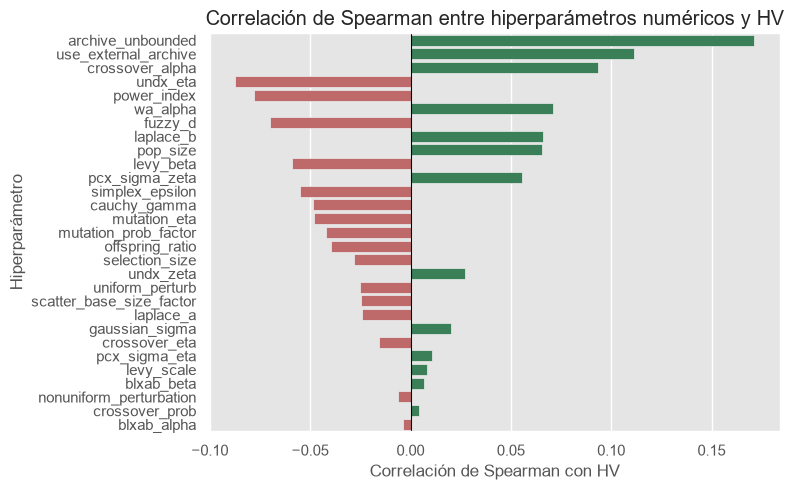

,param,spearman_rho,p_value
0,archive_unbounded,0.171200,2.624455e-09
27,use_external_archive,0.111599,1.114292e-04
4,crossover_alpha,0.093670,1.193411e-03
24,undx_eta,-0.087306,2.532758e-03
20,power_index,-0.077756,7.187003e-03
28,wa_alpha,0.070954,1.419522e-02
7,fuzzy_d,-0.070007,1.554209e-02
10,laplace_b,0.065914,2.274407e-02
19,pop_size,0.065668,2.325683e-02
11,levy_beta,-0.059233,4.071608e-02


In [20]:

spearman_results = []
for num_param in numeric_params:
    rho, pval = stats.spearmanr(trials_df[num_param], trials_df["hv"])
    spearman_results.append({"param": num_param, "spearman_rho": rho, "p_value": pval})

spearman_df = pd.DataFrame(spearman_results).sort_values("spearman_rho", key=abs, ascending=False)

plt.figure(figsize=(8, 5))
colors = ["indianred" if r < 0 else "seagreen" for r in spearman_df["spearman_rho"]]
sns.barplot(data=spearman_df, x="spearman_rho", y="param", palette=colors)
plt.axvline(0, color="black", linewidth=0.8)
plt.xlabel("Correlación de Spearman con HV")
plt.ylabel("Hiperparámetro")
plt.title("Correlación de Spearman entre hiperparámetros numéricos y HV")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "spearman_correlations.png", dpi=120)
plt.show()

spearman_df


### 4.8 ¿Coinciden los dos mejores *samplers* en los hiperparámetros relevantes?

Para cada problema se comparan los dos *samplers* seleccionados: ¿consideran importantes los mismos hiperparámetros? ¿convergen hacia valores similares? Esta es la comprobación central de la Opción C descrita en la introducción del capítulo.


In [23]:

agreement_records = []

for problem, group in importances_df.groupby("problem"):
    samplers_in_problem = group["sampler"].unique()
    if len(samplers_in_problem) != 2:
        continue
    s1, s2 = samplers_in_problem

    ranking1 = group[group["sampler"] == s1].sort_values("importance", ascending=False)["param"].tolist()
    ranking2 = group[group["sampler"] == s2].sort_values("importance", ascending=False)["param"].tolist()

    top1_param = ranking1[0] if ranking1 else None
    top1_sampler2_rank = (ranking2.index(top1_param) + 1) if top1_param in ranking2 else None

    common_top2 = set(ranking1[:2]) & set(ranking2[:2])

    agreement_records.append({
        "problem": problem,
        "sampler_1": s1, "sampler_2": s2,
        "top_param_sampler_1": top1_param,
        "rank_of_that_param_in_sampler_2": top1_sampler2_rank,
        "overlap_top2_params": ", ".join(sorted(common_top2)) if common_top2 else "(ninguno)",
    })

agreement_df = pd.DataFrame(agreement_records)
agreement_df.to_csv(OUTPUT_DIR / "sampler_agreement_per_problem.csv", index=False)
agreement_df


,problem,sampler_1,sampler_2,top_param_sampler_1,rank_of_that_param_in_sampler_2,overlap_top2_params
0,zcat1,nsgaii,tpe,repair,12,(ninguno)
1,zcat10,tpe,nsgaii,uniform_perturb,29,(ninguno)
2,zcat11,qmc,tpe,crossover,1,crossover
3,zcat12,tpe,gp,undx_zeta,30,(ninguno)
4,zcat13,qmc,nsgaii,crossover,31,repair
5,zcat14,tpe,qmc,crossover,11,(ninguno)
6,zcat15,gp,qmc,crossover_eta,12,(ninguno)
7,zcat16,cmaes,random,crossover,3,(ninguno)
8,zcat17,random,nsgaii,crossover,4,(ninguno)
9,zcat18,tpe,random,power_index,11,(ninguno)


In [24]:

pct_agree_top1_in_top2 = (
    agreement_df["rank_of_that_param_in_sampler_2"].dropna().le(2).mean() * 100
)
print(f"Porcentaje de problemas en los que el hiperparámetro más importante de un "
      f"sampler figura entre los 2 más importantes del otro sampler: "
      f"{pct_agree_top1_in_top2:.1f}%")


Porcentaje de problemas en los que el hiperparámetro más importante de un sampler figura entre los 2 más importantes del otro sampler: 5.0%


### 4.9 Configuración maestra recomendada

La configuración final se obtiene **directamente de los datos**: para los hiperparámetros numéricos se toma la mediana de los valores del top 10 % de los *trials*; para los categóricos, la moda (valor más frecuente).


In [25]:

master_config = {}

for num_param in numeric_params:
    master_config[num_param] = top_trials_df[num_param].median()

for cat_param in categorical_params:
    master_config[cat_param] = top_trials_df[cat_param].mode().iloc[0]

master_config_df = pd.DataFrame(
    [{"hiperparametro": k, "valor_recomendado": v} for k, v in master_config.items()]
)
master_config_df.to_csv(OUTPUT_DIR / "master_configuration.csv", index=False)

print("=" * 60)
print("CONFIGURACIÓN RECOMENDADA DE NSGA-II PARA LA SUITE ZCAT")
print("=" * 60)
for k, v in master_config.items():
    print(f"  {k:20s} = {v}")
print("=" * 60)
print(f"\nBasada en los {len(top_trials_df)} trials del top 10% de los {len(trials_df)} "
      f"trials totales, procedentes de los {len(selected_studies)} estudios "
      f"({selected_studies[COL_PROBLEM].nunique()} problemas x "
      f"{N_TOP_SAMPLERS_PER_PROBLEM} samplers).")

master_config_df


CONFIGURACIÓN RECOMENDADA DE NSGA-II PARA LA SUITE ZCAT
  archive_unbounded    = 1.0
  blxab_alpha          = 0.42618396752392357
  blxab_beta           = 0.49152456001245254
  cauchy_gamma         = 0.22568965291547174
  crossover_alpha      = 0.5618988245561435
  crossover_eta        = 18.38102250010688
  crossover_prob       = 0.8381822999617508
  fuzzy_d              = 0.9367390975909354
  gaussian_sigma       = 0.29309724203095633
  laplace_a            = -0.0026206780150503373
  laplace_b            = 0.8828931461345244
  levy_beta            = 1.2288896329743824
  levy_scale           = 0.05037374964200571
  mutation_eta         = 21.89972883315167
  mutation_prob_factor = 1.302229928173694
  nonuniform_perturbation = 0.2709788213375459
  offspring_ratio      = 0.25
  pcx_sigma_eta        = 0.2220661925717784
  pcx_sigma_zeta       = 0.25670407564985515
  pop_size             = 52.5
  power_index          = 2.3564424285335783
  scatter_base_size_factor = 0.5
  selection_size    

,hiperparametro,valor_recomendado
0,archive_unbounded,1.0
1,blxab_alpha,0.426184
2,blxab_beta,0.491525
3,cauchy_gamma,0.22569
4,crossover_alpha,0.561899
5,crossover_eta,18.381023
6,crossover_prob,0.838182
7,fuzzy_d,0.936739
8,gaussian_sigma,0.293097
9,laplace_a,-0.002621
